In [18]:
import numpy as np
from datetime import datetime, timedelta
import matplotlib.pyplot as plt

import scipy.io as sio
import mat73

In [19]:
# Experiment name for output plots
expt_name = 'LS' 

# List of experiment names
experiment_names = ['LS_OLv8_M36','LS_DAv8_M36']

# insitu_tag plus details of timestep and number of years analysed in matlab file name
insitu_tag = '_SCAN_SM_1d_c1234smv_25yr'

# Create MATLAB file names based on experiment names
matlab_files = [f'/Users/amfox/Desktop/GEOSldas_diagnostics/test_data/M21C_land_sweeper_v2/{name}'+ insitu_tag +'_stats.mat' for name in experiment_names]

# Read the first MATLAB file to get the shape of Bias
first_file = matlab_files[0]
mat_contents = sio.loadmat(first_file)
shape = mat_contents['Bias'].shape

# Create empty arrays with the shape of Bias and number of experiments
num_exp = len(matlab_files)
Bias = np.zeros(shape + (num_exp,))
BiasLO = np.zeros(shape + (num_exp,))
BiasUP = np.zeros(shape + (num_exp,))
RMSE = np.zeros(shape + (num_exp,))
RMSELO = np.zeros(shape + (num_exp,))
RMSEUP = np.zeros(shape + (num_exp,))
R = np.zeros(shape + (num_exp,))
RLO = np.zeros(shape + (num_exp,))
RUP = np.zeros(shape + (num_exp,))
absBias = np.zeros(shape + (num_exp,))
absBiasLO = np.zeros(shape + (num_exp,))
absBiasUP = np.zeros(shape + (num_exp,))
anomR = np.zeros(shape + (num_exp,))
anomRLO = np.zeros(shape + (num_exp,))
anomRUP = np.zeros(shape + (num_exp,))
ubRMSE = np.zeros(shape + (num_exp,))
ubRMSELO = np.zeros(shape + (num_exp,))
ubRMSEUP = np.zeros(shape + (num_exp,))

# Read data from the MATLAB files
for i, file in enumerate(matlab_files):
    mat_contents = sio.loadmat(file)
    Bias[:, :, i] = mat_contents['Bias']
    BiasLO[:, :, i] = mat_contents['BiasLO']
    BiasUP[:, :, i] = mat_contents['BiasUP']
    RMSE[:, :, i] = mat_contents['RMSE']
    RMSELO[:, :, i] = mat_contents['RMSELO']
    RMSEUP[:, :, i] = mat_contents['RMSEUP']
    R[:, :, i] = mat_contents['R']
    RLO[:, :, i] = mat_contents['RLO']
    RUP[:, :, i] = mat_contents['RUP']
    absBias[:, :, i] = mat_contents['absBias']
    absBiasLO[:, :, i] = mat_contents['absBiasLO']
    absBiasUP[:, :, i] = mat_contents['absBiasUP']
    anomR[:, :, i] = mat_contents['anomR']
    anomRLO[:, :, i] = mat_contents['anomRLO']
    anomRUP[:, :, i] = mat_contents['anomRUP']
    ubRMSE[:, :, i] = mat_contents['ubRMSE']
    ubRMSELO[:, :, i] = mat_contents['ubRMSELO']
    ubRMSEUP[:, :, i] = mat_contents['ubRMSEUP']

In [20]:
# Get info about ubRMSE
print(ubRMSE.shape)
print(ubRMSE.dtype)

num_sites = ubRMSE.shape[0]
print("num_sites: ", num_sites)

num_depths = ubRMSE.shape[1]
print("num_depths: ", num_depths)

num_expts = ubRMSE.shape[2]
print("num_expts: ", num_expts)

(146, 2, 2)
float64
num_sites:  146
num_depths:  2
num_expts:  2


In [21]:
# Calculate R_mean, Bias, RMSE, and ubRMSE from R
R_mean = np.around(np.nanmean(R, axis=0), decimals=2)
print('R_mean: ', R_mean)
R_std = np.around(np.nanstd(R, axis=0), decimals=3)
num_sites_sr = np.sum(~np.isnan(R), axis=0)
R_CI_LO = np.around(np.nanmean(RLO, axis=0) / np.sqrt(num_sites_sr), decimals=4)
print('R_CI_LO: ', R_CI_LO)
R_CI_UP = np.around(np.nanmean(RUP, axis=0) / np.sqrt(num_sites_sr), decimals=4)
print('R_CI_UP: ', R_CI_UP)
R_CI = np.array([-R_CI_LO, R_CI_UP])
print('R_CI: ', R_CI)
print('R_CI[:, 0, :]: ', R_CI[:, 0, :])

anomR_mean = np.around(np.nanmean(anomR, axis=0), decimals=2)
anomR_std = np.around(np.nanstd(anomR, axis=0), decimals=3)
num_sites_sr = np.sum(~np.isnan(anomR), axis=0)
anomR_CI_LO = np.around(np.nanmean(anomRLO, axis=0) / np.sqrt(num_sites_sr), decimals=4)
anomR_CI_UP = np.around(np.nanmean(anomRUP, axis=0) / np.sqrt(num_sites_sr), decimals=4)
anomR_CI = np.array([-anomR_CI_LO, anomR_CI_UP])
print('anomR_mean: ', anomR_mean)

Bias_mean = np.around(np.nanmean(Bias, axis=0), decimals=3)
Bias_std = np.around(np.nanstd(Bias, axis=0), decimals=3)
num_sites_sr = np.sum(~np.isnan(Bias), axis=0)
Bias_CI_LO = np.around(np.nanmean(BiasLO, axis=0) / np.sqrt(num_sites_sr), decimals=4)
Bias_CI_UP = np.around(np.nanmean(BiasUP, axis=0) / np.sqrt(num_sites_sr), decimals=4)
Bias_CI = np.array([-Bias_CI_LO, Bias_CI_UP])

absBias_mean = np.around(np.nanmean(absBias, axis=0), decimals=3)
absBias_std = np.around(np.nanstd(absBias, axis=0), decimals=3)
num_sites_sr = np.sum(~np.isnan(absBias), axis=0)
absBias_CI_LO = np.around(np.nanmean(absBiasLO, axis=0) / np.sqrt(num_sites_sr), decimals=4)
absBias_CI_UP = np.around(np.nanmean(absBiasUP, axis=0) / np.sqrt(num_sites_sr), decimals=4)
absBias_CI = np.array([-absBias_CI_LO, absBias_CI_UP])

RMSE_mean = np.around(np.nanmean(RMSE, axis=0), decimals=3)
RMSE_std = np.around(np.nanstd(RMSE, axis=0), decimals=3)
num_sites_sr = np.sum(~np.isnan(RMSE), axis=0)
RMSE_CI_LO = np.around(np.nanmean(RMSELO, axis=0) / np.sqrt(num_sites_sr), decimals=4)
RMSE_CI_UP = np.around(np.nanmean(RMSEUP, axis=0) / np.sqrt(num_sites_sr), decimals=4)
RMSE_CI = np.array([-RMSE_CI_LO, RMSE_CI_UP])

ubRMSE_mean = np.around(np.nanmean(ubRMSE, axis=0), decimals=3)
ubRMSE_std = np.around(np.nanstd(ubRMSE, axis=0), decimals=3)
num_sites_sr = np.sum(~np.isnan(ubRMSE), axis=0)
ubRMSE_CI_LO = np.around(np.nanmean(ubRMSELO, axis=0) / np.sqrt(num_sites_sr), decimals=4)
ubRMSE_CI_UP = np.around(np.nanmean(ubRMSEUP, axis=0) / np.sqrt(num_sites_sr), decimals=4)
ubRMSE_CI = np.array([-ubRMSE_CI_LO, ubRMSE_CI_UP])

print('ubRMSE_mean: ', ubRMSE_mean)

R_mean:  [[0.62 0.65]
 [0.64 0.66]]
R_CI_LO:  [[-0.0069 -0.0064]
 [-0.0181 -0.0172]]
R_CI_UP:  [[0.0058 0.0054]
 [0.0121 0.0115]]
R_CI:  [[[0.0069 0.0064]
  [0.0181 0.0172]]

 [[0.0058 0.0054]
  [0.0121 0.0115]]]
R_CI[:, 0, :]:  [[0.0069 0.0064]
 [0.0058 0.0054]]
anomR_mean:  [[0.54 0.58]
 [0.55 0.58]]
ubRMSE_mean:  [[0.057 0.056]
 [0.039 0.038]]


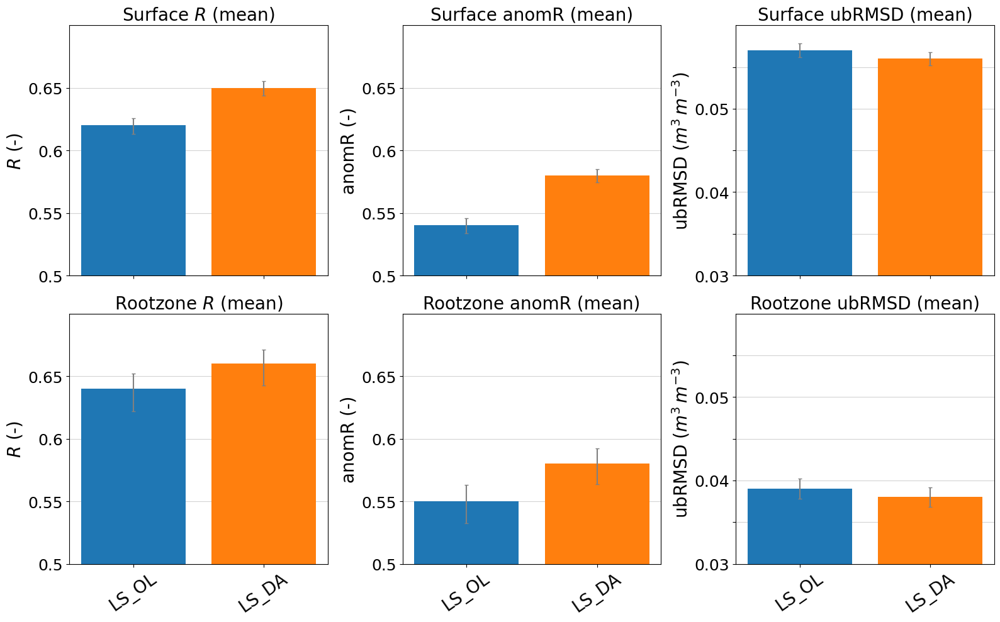

In [22]:
expt_labels = ["LS_OL", "LS_DA"]

ind = np.arange(num_expts)

title_fontsize = 20
label_fontsize = 20
y_tick_label_fontsize = 18

# Create a figure with a 2x3 subplot grid
fig, axs = plt.subplots(2, 3, figsize=(16, 10))

# Subplot 1: Surface R_mean
axs[0, 0].bar(ind, R_mean[0, :num_expts], color=plt.rcParams['axes.prop_cycle'].by_key()['color'][:num_expts])
axs[0, 0].errorbar(ind, R_mean[0, :num_expts], yerr=R_CI[:, 0, :num_expts], fmt='none', ecolor='grey', capsize=2)
# axs[0, 0].set_xlabel('Experiments')
axs[0, 0].set_ylabel(r'$R$ (-)', fontsize=label_fontsize)
axs[0, 0].set_ylim(0.5, 0.7)
axs[0, 0].set_yticks(np.arange(0.5, 0.7, 0.05))
axs[0, 0].set_yticklabels([0.5, 0.55, 0.6, 0.65], fontsize=y_tick_label_fontsize)
axs[0, 0].set_axisbelow(True)
axs[0, 0].grid(axis='y', color='lightgrey')
axs[0, 0].set_title(r'Surface $R$ (mean)', fontsize=title_fontsize)
axs[0, 0].set_xticks(ind)
#axs[0, 0].set_xticklabels(expt_labels[:num_expts], rotation=25, fontsize=14)
axs[0, 0].set_xticklabels('', fontsize=1)

# Subplot 2: anomR_mean
axs[0, 1].bar(ind, anomR_mean[0, :num_expts], color=plt.rcParams['axes.prop_cycle'].by_key()['color'][:num_expts])
axs[0, 1].errorbar(ind, anomR_mean[0, :num_expts], yerr=anomR_CI[:, 0, :num_expts], fmt='none', ecolor='grey', capsize=2)
#axs[0, 1].set_xlabel('Experiments')
axs[0, 1].set_ylabel('anomR (-)', fontsize=label_fontsize)
axs[0, 1].set_ylim(0.5, 0.7)
axs[0, 1].set_yticks(np.arange(0.5, 0.7, 0.05))
axs[0, 1].set_yticklabels([0.5, 0.55, 0.6, 0.65], fontsize=y_tick_label_fontsize)
axs[0, 1].set_axisbelow(True)
axs[0, 1].grid(axis='y', color='lightgrey')
axs[0, 1].set_title('Surface anomR (mean)', fontsize=title_fontsize)
axs[0, 1].set_xticks(ind)
# axs[0, 1].set_xticklabels(expt_labels[:num_expts], rotation=25, fontsize=14)
axs[0, 1].set_xticklabels('', fontsize=1)

# Subplot 3: Surface ubRMSE_mean
axs[0, 2].bar(ind, ubRMSE_mean[0, :num_expts], color=plt.rcParams['axes.prop_cycle'].by_key()['color'][:num_expts])
axs[0, 2].errorbar(ind, ubRMSE_mean[0, :num_expts], yerr=ubRMSE_CI[:, 0, :num_expts], fmt='none', ecolor='grey', capsize=2)
# axs[0, 1].set_xlabel('Experiments')
axs[0, 2].set_ylabel('ubRMSD ($m^3 \, m^{-3}$)', fontsize=label_fontsize)
axs[0, 2].set_ylim(0.03, 0.06)
axs[0, 2].set_yticks(np.arange(0.03, 0.06, 0.005))
axs[0, 2].set_yticklabels([0.03, ' ', 0.04, ' ', 0.05, ' '], fontsize=y_tick_label_fontsize)
axs[0, 2].set_axisbelow(True)
axs[0, 2].grid(axis='y', color='lightgrey')
axs[0, 2].set_title('Surface ubRMSD (mean)', fontsize=title_fontsize)
axs[0, 2].set_xticks(ind)
# axs[0, 2].set_xticklabels(expt_labels[:num_expts], rotation=25, fontsize=14)
axs[0, 2].set_xticklabels('', fontsize=1)

# Subplot 4: Root zone R_mean
axs[1, 0].bar(ind, R_mean[1, :num_expts], color=plt.rcParams['axes.prop_cycle'].by_key()['color'][:num_expts])
axs[1, 0].errorbar(ind, R_mean[1, :num_expts], yerr=R_CI[:, 1, :num_expts], fmt='none', ecolor='grey', capsize=2)
#axs[1, 0].set_xlabel('Experiments', fontsize=14)
axs[1, 0].set_ylabel(r'$R$ (-)', fontsize=label_fontsize)
axs[1, 0].set_ylim(0.5, 0.7)
axs[1, 0].set_yticks(np.arange(0.5, 0.7, 0.05))
axs[1, 0].set_yticklabels([0.5, 0.55, 0.6, 0.65], fontsize=y_tick_label_fontsize)
axs[1, 0].set_axisbelow(True)
axs[1, 0].grid(axis='y', color='lightgrey')
axs[1, 0].set_title(r'Rootzone $R$ (mean)', fontsize=title_fontsize)
axs[1, 0].set_xticks(ind)
axs[1, 0].set_xticklabels(expt_labels[:num_expts], rotation=35, fontsize=label_fontsize)

# Subplot 5: anomR_mean
axs[1, 1].bar(ind, anomR_mean[1, :num_expts], color=plt.rcParams['axes.prop_cycle'].by_key()['color'][:num_expts])
axs[1, 1].errorbar(ind, anomR_mean[1, :num_expts], yerr=anomR_CI[:, 1, :num_expts], fmt='none', ecolor='grey', capsize=2)
#axs[1, 1].set_xlabel('Experiments', fontsize=14)
axs[1, 1].set_ylabel('anomR (-)', fontsize=label_fontsize)
axs[1, 1].set_ylim(0.5, 0.7)
axs[1, 1].set_yticks(np.arange(0.5, 0.7, 0.05))
axs[1, 1].set_yticklabels([0.5, 0.55, 0.6, 0.65], fontsize=y_tick_label_fontsize)
axs[1, 1].set_axisbelow(True)
axs[1, 1].grid(axis='y', color='lightgrey')
axs[1, 1].set_title('Rootzone anomR (mean)', fontsize=title_fontsize)
axs[1, 1].set_xticks(ind)
axs[1, 1].set_xticklabels(expt_labels[:num_expts], rotation=35, fontsize=label_fontsize)

# Subplot 6: Root zone ubRMSE_mean
axs[1, 2].bar(ind, ubRMSE_mean[1, :num_expts], color=plt.rcParams['axes.prop_cycle'].by_key()['color'][:num_expts])
axs[1, 2].errorbar(ind, ubRMSE_mean[1, :num_expts], yerr=ubRMSE_CI[:, 1, :num_expts], fmt='none', ecolor='grey', capsize=2)
#axs[1, 2].set_xlabel('Experiments', fontsize=14)
axs[1, 2].set_ylabel('ubRMSD ($m^3 \, m^{-3}$)', fontsize=label_fontsize)
axs[1, 2].set_ylim(0.03, 0.06)
axs[1, 2].set_yticks(np.arange(0.03, 0.06, 0.005))
axs[1, 2].set_yticklabels([0.03, ' ', 0.04, ' ', 0.05, ' '], fontsize=y_tick_label_fontsize)
axs[1, 2].set_axisbelow(True)
axs[1, 2].grid(axis='y', color='lightgrey')
axs[1, 2].set_title('Rootzone ubRMSD (mean)', fontsize=title_fontsize)
axs[1, 2].set_xticks(ind)
axs[1, 2].set_xticklabels(expt_labels[:num_expts], rotation=35, fontsize=label_fontsize)

plt.tight_layout()

plt.savefig(expt_name + '_surf_rz_stats.png')

plt.show()

In [23]:
m_rs_file = '/Users/amfox/Desktop/GEOSldas_diagnostics/test_data/M21C_land_sweeper_v2/LS_OLv8_M36_SCAN_SM_1d_c1234smv_25yr_raw_timeseries.mat'
mat_contents = sio.loadmat(m_rs_file)

# List of variables and their dimensions in the MATLAB file
print(sio.whosmat(m_rs_file))

vars = [k for k in mat_contents.keys() if not k.startswith('__')]
print('Variables in MAT file:')
for name in vars:
    val = mat_contents[name]
    shp = getattr(val, 'shape', None)
    print(f"{name}: type={type(val).__name__}, shape={shp}")

# ...existing code...


[('INSITU_id', (1, 146), 'cell'), ('INSITU_id_string', (1,), 'char'), ('INSITU_lat', (146, 1), 'double'), ('INSITU_lon', (146, 1), 'double'), ('INSITU_path', (1,), 'char'), ('INSITU_sm', (8766, 2, 146), 'double'), ('INSITU_st', (8766, 5, 146), 'double'), ('INSITU_tag', (1,), 'char'), ('LDAS_prcp_org', (8766, 1, 146), 'double'), ('LDAS_sm_org', (8766, 2, 146), 'double'), ('LDAS_st_org', (8766, 2, 146), 'double'), ('Nmin', (1, 1), 'double'), ('add_anomR', (1, 1), 'double'), ('data_ext', (1,), 'char'), ('date_time', (1, 1), 'struct'), ('date_time_string', (1,), 'char'), ('date_time_vec', (1, 8766), 'struct'), ('date_time_vec1', (1, 1), 'struct'), ('distance', (112573, 1), 'double'), ('distance_min', (1, 146), 'double'), ('domain', (1,), 'char'), ('dtstep', (1, 1), 'double'), ('end_time', (1, 1), 'struct'), ('exp_path', (1,), 'char'), ('exp_run', (1,), 'char'), ('exp_run_name', (2, 1), 'cell'), ('file_ext', (1,), 'char'), ('file_tag', (1,), 'char'), ('fname', (1,), 'char'), ('fname_tilecoo

In [24]:
m_rs_file = '/Users/amfox/Desktop/GEOSldas_diagnostics/test_data/M21C_land_sweeper_v2/LS_OLv8_M36_SCAN_SM_1d_c1234smv_25yr_raw_timeseries.mat'

def unwrap(x):
    while isinstance(x, np.ndarray) and x.size == 1:
        x = x.ravel()[0]
    return x


# load mat (squeeze_me to remove singleton dims, struct_as_record for easier struct access)
mat = sio.loadmat(m_rs_file)

INSITU_sm = mat.get('INSITU_sm')
INSITU_id = mat.get('INSITU_id')
LDAS_sm_OL = mat.get('LDAS_sm_org')

print("INSITU_sm type/shape:", type(INSITU_sm), None if INSITU_sm is None else INSITU_sm.shape)
print("INSITU_id type/shape:", type(INSITU_id), None if INSITU_id is None else np.atleast_1d(INSITU_id).shape)


dt_array = mat['date_time_vec']  # existing loaded variable
n = dt_array.size

timestamps = []
for i in range(n):
    e = unwrap(dt_array.ravel()[i])
    names = e.dtype.names
    # safe extraction with defaults
    y = int(np.squeeze(e['year'])) if 'year' in names else 0
    mo = int(np.squeeze(e['month'])) if 'month' in names else 1
    d = int(np.squeeze(e['day'])) if 'day' in names else 1
    hr = int(np.squeeze(e['hour'])) if 'hour' in names else 0
    mn = int(np.squeeze(e['min'])) if 'min' in names else 0
    sc = int(np.squeeze(e['sec'])) if 'sec' in names else 0
    timestamps.append(datetime(y, mo, d, hr, mn, sc))

# example: first 5 timestamps
print(timestamps[:5])

print("number of timestamps:", len(timestamps))
if len(timestamps) > 0:
    print("first timestamp:", timestamps[0], "last timestamp:", timestamps[-1])



INSITU_sm type/shape: <class 'numpy.ndarray'> (8766, 2, 146)
INSITU_id type/shape: <class 'numpy.ndarray'> (1, 146)
[datetime.datetime(2000, 6, 1, 12, 0), datetime.datetime(2000, 6, 2, 12, 0), datetime.datetime(2000, 6, 3, 12, 0), datetime.datetime(2000, 6, 4, 12, 0), datetime.datetime(2000, 6, 5, 12, 0)]
number of timestamps: 8766
first timestamp: 2000-06-01 12:00:00 last timestamp: 2024-05-31 12:00:00


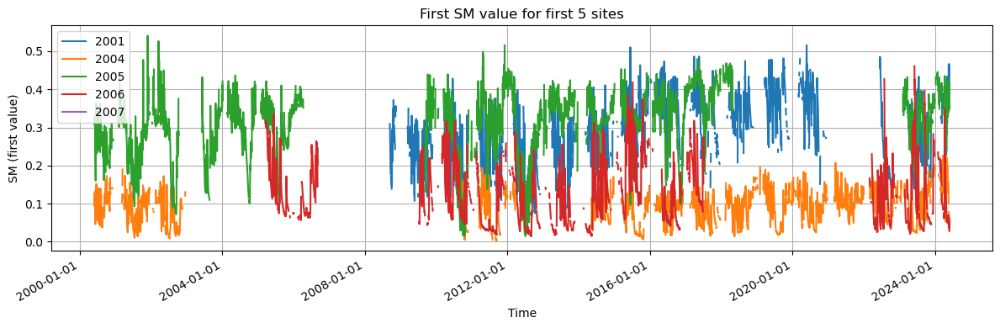

In [25]:
# ...existing code...
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter, AutoDateLocator
import numpy as np

assert 'INSITU_sm' in globals(), "INSITU_sm not loaded"
assert 'timestamps' in globals(), "timestamps not available"

n_time = INSITU_sm.shape[0]
n_sites_plot = min(5, INSITU_sm.shape[2])
timestamps_arr = np.array(timestamps)  # list of datetimes -> works with matplotlib

# prepare ids if available
ids = []
if 'INSITU_id' in globals():
    ids_arr = np.atleast_1d(INSITU_id).ravel()
    for a in ids_arr[:n_sites_plot]:
        v = a
        if isinstance(v, np.ndarray): v = np.squeeze(v)
        if isinstance(v, bytes): v = v.decode('utf-8')
        ids.append(str(v))
else:
    ids = [str(i) for i in range(n_sites_plot)]

plt.figure(figsize=(12, 4))
for i in range(n_sites_plot):
    series = INSITU_sm[:, 0, i].astype(float)  # first SM value
    plt.plot(timestamps_arr, series, label=ids[i])

plt.xlabel('Time')
plt.ylabel('SM (first value)')
plt.title('First SM value for first 5 sites')
plt.legend()
plt.grid(True)
ax = plt.gca()
ax.xaxis.set_major_locator(AutoDateLocator())
ax.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
plt.xticks(rotation=30, ha='right')
plt.tight_layout()
plt.show()
# ...existing code...

In [26]:
# ...existing code...
n_times, _, n_sites = INSITU_sm.shape

ids = []
if 'INSITU_id' in globals():
    ids_arr = np.atleast_1d(INSITU_id).ravel()
    for a in ids_arr[:n_sites]:
        v = a
        if isinstance(v, np.ndarray): v = np.squeeze(v)
        if isinstance(v, bytes): v = v.decode('utf-8')
        ids.append(str(v))
else:
    ids = [str(i) for i in range(n_sites)]

assert 'timestamps' in globals(), "timestamps not available"

# compute valid mask per depth
valid_d0 = ~np.isnan(INSITU_sm[:, 0, :])             # shape (ntime, n_sites)
valid_d1 = ~np.isnan(INSITU_sm[:, 1, :]) if INSITU_sm.shape[1] > 1 else np.zeros((n_times, n_sites), dtype=bool)

# prepare storage
first_dates_d0 = np.empty(n_sites, dtype=object)
last_dates_d0  = np.empty(n_sites, dtype=object)
first_idx_d0   = -np.ones(n_sites, dtype=int)
last_idx_d0    = -np.ones(n_sites, dtype=int)

first_dates_d1 = np.empty(n_sites, dtype=object)
last_dates_d1  = np.empty(n_sites, dtype=object)
first_idx_d1   = -np.ones(n_sites, dtype=int)
last_idx_d1    = -np.ones(n_sites, dtype=int)

for j in range(n_sites):
    idxs0 = np.where(valid_d0[:, j])[0]
    if idxs0.size == 0:
        first_dates_d0[j] = None; last_dates_d0[j] = None
        first_idx_d0[j] = -1; last_idx_d0[j] = -1
    else:
        first_idx_d0[j] = int(idxs0[0]); last_idx_d0[j] = int(idxs0[-1])
        first_dates_d0[j] = timestamps[first_idx_d0[j]]; last_dates_d0[j] = timestamps[last_idx_d0[j]]

    idxs1 = np.where(valid_d1[:, j])[0]
    if idxs1.size == 0:
        first_dates_d1[j] = None; last_dates_d1[j] = None
        first_idx_d1[j] = -1; last_idx_d1[j] = -1
    else:
        first_idx_d1[j] = int(idxs1[0]); last_idx_d1[j] = int(idxs1[-1])
        first_dates_d1[j] = timestamps[first_idx_d1[j]]; last_dates_d1[j] = timestamps[last_idx_d1[j]]

# print concise summary
for j in range(n_sites):
    idstr = ids[j] if j < len(ids) else str(j)
    d0 = ("no obs" if first_dates_d0[j] is None else f"{first_dates_d0[j]} -> {last_dates_d0[j]}")
    d1 = ("no obs" if first_dates_d1[j] is None else f"{first_dates_d1[j]} -> {last_dates_d1[j]}")
    print(f"site {j} ({idstr}): depth1 = {d0}; depth2 = {d1}")
# ...existing code...

site 0 (2001): depth1 = 2008-09-15 12:00:00 -> 2024-05-31 12:00:00; depth2 = 2011-03-17 12:00:00 -> 2024-05-30 12:00:00
site 1 (2004): depth1 = 2000-06-01 12:00:00 -> 2024-05-31 12:00:00; depth2 = 2000-06-01 12:00:00 -> 2024-05-31 12:00:00
site 2 (2005): depth1 = 2000-06-01 12:00:00 -> 2024-05-31 12:00:00; depth2 = 2015-06-07 12:00:00 -> 2024-05-31 12:00:00
site 3 (2006): depth1 = 2005-03-20 12:00:00 -> 2024-05-31 12:00:00; depth2 = 2005-03-20 12:00:00 -> 2024-05-31 12:00:00
site 4 (2007): depth1 = no obs; depth2 = no obs
site 5 (2008): depth1 = 2007-08-31 12:00:00 -> 2024-05-31 12:00:00; depth2 = 2007-08-31 12:00:00 -> 2023-11-21 12:00:00
site 6 (2009): depth1 = 2005-12-01 12:00:00 -> 2024-05-31 12:00:00; depth2 = 2005-12-01 12:00:00 -> 2024-05-31 12:00:00
site 7 (2010): depth1 = no obs; depth2 = no obs
site 8 (2011): depth1 = 2000-06-09 12:00:00 -> 2024-05-31 12:00:00; depth2 = 2000-06-09 12:00:00 -> 2003-08-28 12:00:00
site 9 (2012): depth1 = 2000-06-05 12:00:00 -> 2024-05-31 12:00:

site 0 (2001): days per depth = [2986, 702]
site 1 (2004): days per depth = [3727, 3150]
site 2 (2005): days per depth = [4478, 1020]
site 3 (2006): days per depth = [3089, 1658]
site 4 (2007): days per depth = [0, 0]
site 5 (2008): days per depth = [3934, 1405]
site 6 (2009): days per depth = [5159, 3245]
site 7 (2010): days per depth = [0, 0]
site 8 (2011): days per depth = [5209, 621]
site 9 (2012): days per depth = [4184, 1855]
Top 10 sites with most days of observations at depth 0:
 1. site 21 (2027): 7437 days from 2000-06-13 to 2024-05-31
 2. site 28 (2035): 7133 days from 2000-06-01 to 2023-05-19
 3. site 19 (2025): 6900 days from 2000-06-01 to 2024-05-31
 4. site 37 (2046): 6804 days from 2003-01-02 to 2024-05-31
 5. site 32 (2039): 6517 days from 2000-07-11 to 2024-05-31
 6. site 16 (2022): 6507 days from 2001-01-13 to 2024-05-31
 7. site 31 (2038): 6189 days from 2003-01-10 to 2024-05-31
 8. site 12 (2015): 6182 days from 2000-06-01 to 2024-05-31
 9. site 72 (2091): 6061 day

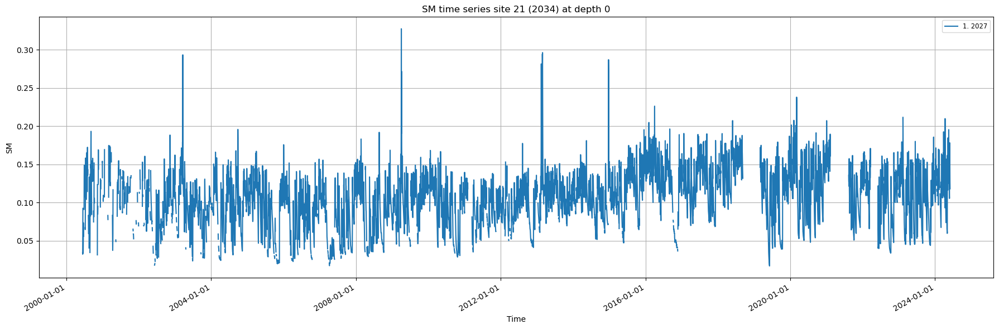

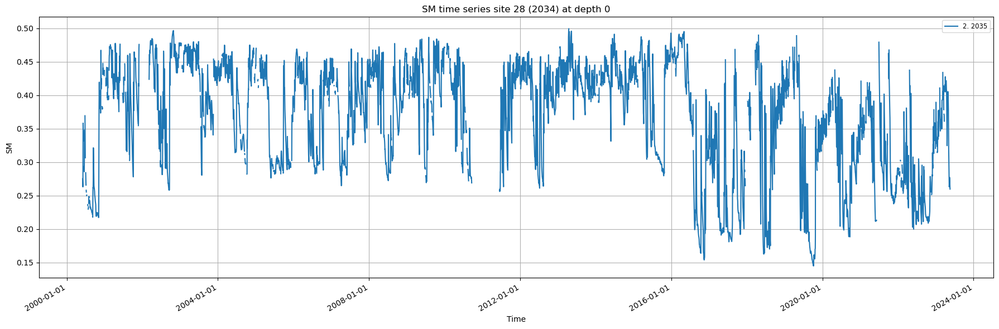

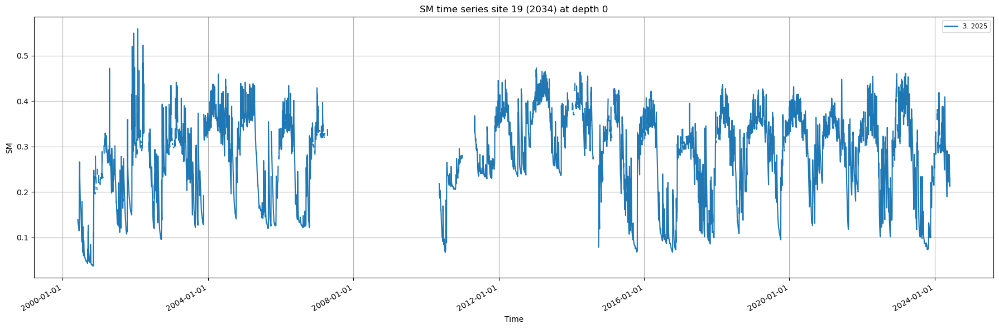

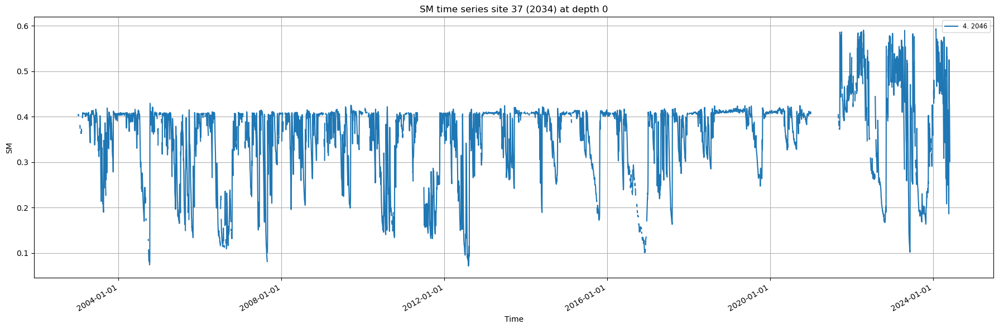

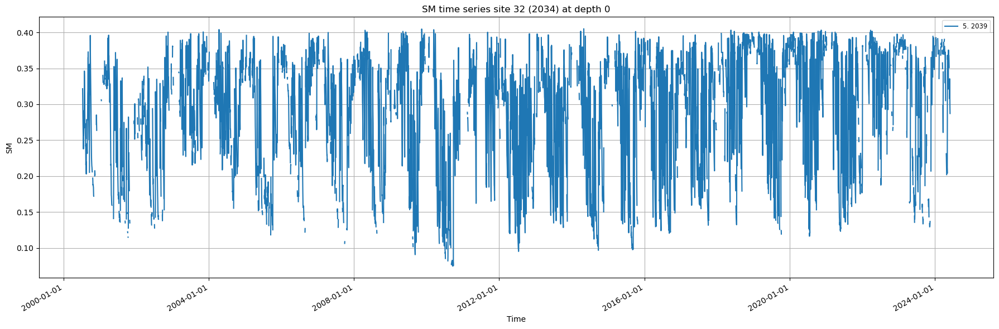

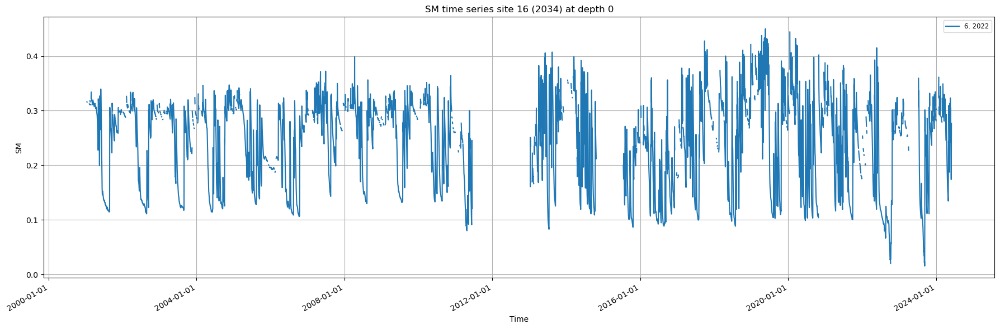

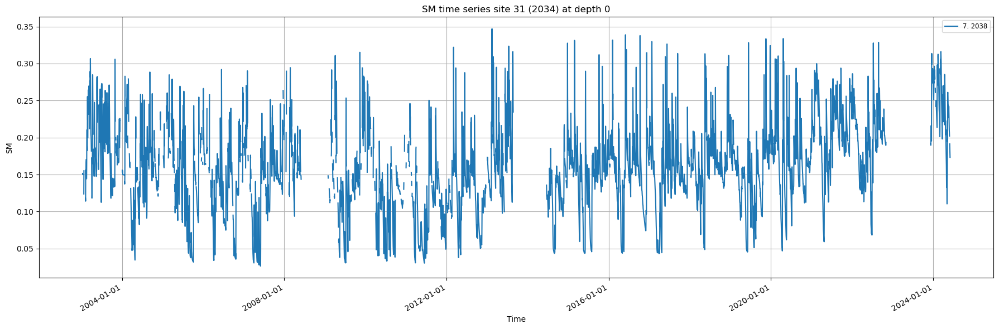

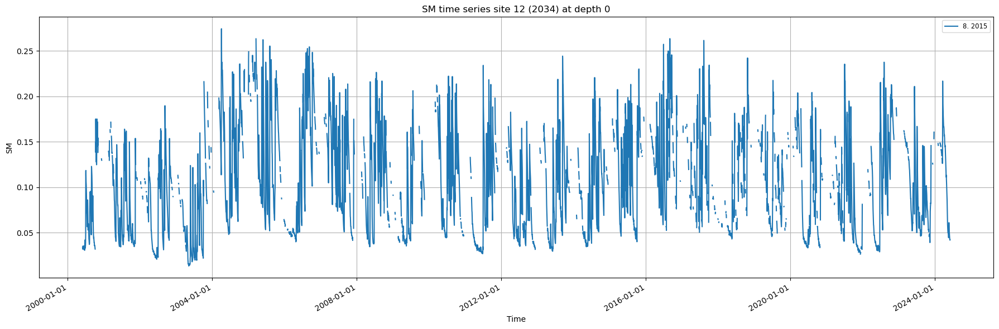

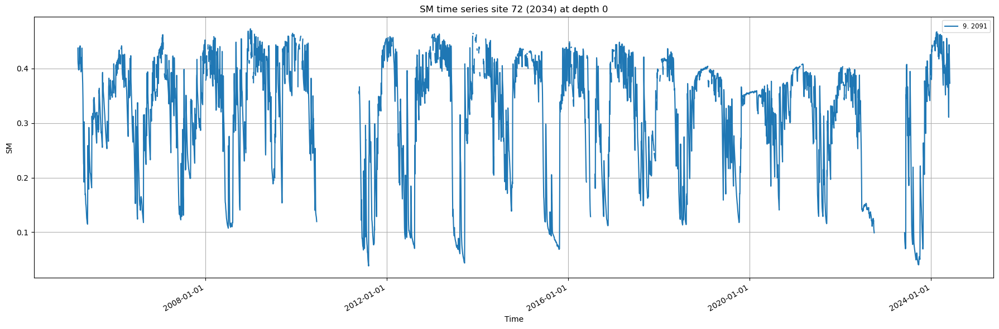

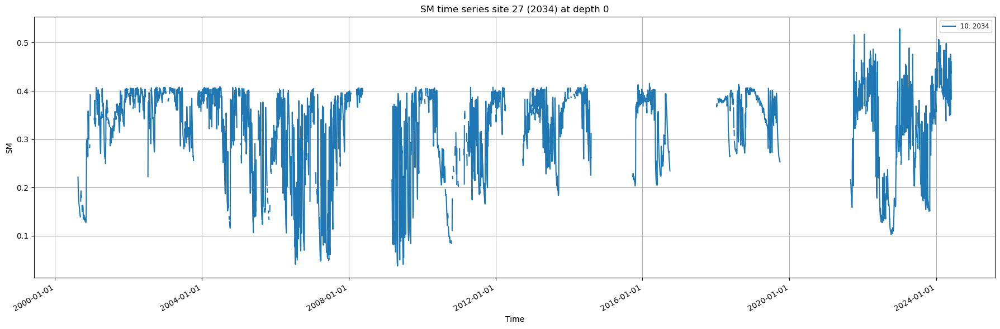

Top 10 sites with most days of observations at depth 1:
 1. site 32 (2039): 6377 days from 2000-07-11 to 2024-05-31
 2. site 28 (2035): 6040 days from 2001-01-12 to 2023-05-19
 3. site 60 (2077): 5675 days from 2005-01-02 to 2024-05-31
 4. site 46 (2057): 4739 days from 2007-04-11 to 2024-05-31
 5. site 21 (2027): 4611 days from 2000-06-14 to 2024-05-31
 6. site 20 (2026): 4586 days from 2004-09-17 to 2024-05-30
 7. site 61 (2078): 4231 days from 2007-04-15 to 2024-05-31
 8. site 71 (2090): 4129 days from 2004-05-06 to 2024-05-31
 9. site 33 (2040): 4095 days from 2000-06-08 to 2019-06-17
10. site 44 (2055): 3959 days from 2004-09-21 to 2024-05-31


In [27]:
# ...existing code...
import numpy as np

# 1) ensure inputs present and aligned
assert 'timestamps' in globals(), "timestamps not available"
assert 'INSITU_sm' in globals(), "INSITU_sm not loaded"
timestamps_arr = np.array(timestamps)
n_times, n_depths, n_sites = INSITU_sm.shape
assert timestamps_arr.shape[0] == n_times, "timestamps length != INSITU_sm time dimension"

# 2) date-only array for grouping by calendar day
dates_only = np.array([ts.date() for ts in timestamps_arr])

# 3) storage for results
days_counts = np.zeros((n_depths, n_sites), dtype=int)
unique_days = [[None for _ in range(n_sites)] for _ in range(n_depths)]

# 4) loop depths/sites: mask non-NaN times, get unique dates, count
for d in range(n_depths):
    for j in range(n_sites):
        valid_mask = ~np.isnan(INSITU_sm[:, d, j])            # times with obs at this depth/site
        if not np.any(valid_mask):
            unique_days[d][j] = np.array([], dtype=object)
            days_counts[d, j] = 0
        else:
            days = np.unique(dates_only[valid_mask])         # unique calendar days with at least one obs
            unique_days[d][j] = days
            days_counts[d, j] = days.size

# 5) example summary for first 10 sites
for j in range(min(10, n_sites)):
    idstr = ids[j] if j < len(ids) else str(j)
    counts_str = ', '.join(str(int(days_counts[d, j])) for d in range(n_depths))
    print(f"site {j} ({idstr}): days per depth = [{counts_str}]")
# ...existing code...

# list the 20 sites with the most days of observations at depth 0
n_top = 10  
depth = 0
top_indices = np.argsort(-days_counts[depth, :])[:n_top]  # negative for descending sort
print(f"Top {n_top} sites with most days of observations at depth {depth}:")
for rank, j in enumerate(top_indices, start=1):
    idstr = ids[j] if j < len(ids) else str(j)
    count = int(days_counts[depth, j])
    first_date = unique_days[depth][j][0] if count > 0 else None
    last_date = unique_days[depth][j][-1] if count > 0 else None
    print(f"{rank:2d}. site {j} ({idstr}): {count} days from {first_date} to {last_date}")

# For each site want to print how many days of obs between 2000-06-01 and 2007-06-01 and then
# between 2007-06-01 and 2015-04-01, and then between 2015-04-01 and 2024-06-31

for rank, j in enumerate(top_indices, start=1):
    idstr = ids[j] if j < len(ids) else str(j)
    days = unique_days[depth][j]
    count1 = np.sum((days >= datetime(2000, 6, 1).date()) & (days < datetime(2007, 6, 1).date()))
    count2 = np.sum((days >= datetime(2007, 6, 1).date()) & (days < datetime(2015, 4, 1).date()))
    count3 = np.sum((days >= datetime(2015, 4, 1).date()) & (days <= datetime(2024, 6, 30).date()))
    print(f"{rank:2d}. site {j} ({idstr}): {count1} days from 2000-06-01 to 2007-06-01; "
          f"{count2} days from 2007-06-01 to 2015-04-01; {count3} days from 2015-04-01 to 2024-06-30")

# Plot a time series of SM at these sites

for rank, j in enumerate(top_indices, start=1):
    series = INSITU_sm[:, depth, j].astype(float)  # SM at selected depth
    plt.figure(figsize=(18, 6))
    plt.plot(timestamps_arr, series, label=f"{rank}. {ids[j] if j < len(ids) else str(j)}")
    plt.xlabel('Time')
    plt.ylabel('SM')
    plt.title(f'SM time series site {j} ({idstr}) at depth {depth}')
    plt.legend(fontsize='small', ncol=2)
    plt.grid(True)
    ax = plt.gca()
    ax.xaxis.set_major_locator(AutoDateLocator())
    ax.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    plt.show()    

# Repeat for depth 0
depth = 1
top_indices = np.argsort(-days_counts[depth, :])[:n_top]  # negative for descending sort
print(f"Top {n_top} sites with most days of observations at depth {depth}:")
for rank, j in enumerate(top_indices, start=1):
    idstr = ids[j] if j < len(ids) else str(j)
    count = int(days_counts[depth, j])
    first_date = unique_days[depth][j][0] if count > 0 else None
    last_date = unique_days[depth][j][-1] if count > 0 else None
    print(f"{rank:2d}. site {j} ({idstr}): {count} days from {first_date} to {last_date}")


In [28]:
from datetime import datetime
import numpy as np

# --- config ---
depth = 0                  # 0=surface, 1=rootzone (adjust as needed)
top_n_total = 30
periods = [
    ("P1", datetime(2000, 6, 1).date(), datetime(2007, 6, 1).date()),   # [start, end)
    ("P2", datetime(2007, 6, 1).date(), datetime(2015, 4, 1).date()),
    ("P3", datetime(2015, 4, 1).date(), datetime(2024, 6, 30).date()),  # inclusive end for your use case
]

# --- compute counts per site, per period ---
counts_by_site = []  # (site_idx, site_id, counts[3], total, balance_std)

for j in range(n_sites):
    days = unique_days[depth][j]
    if days is None or len(days) == 0:
        continue

    c = np.array([
        np.sum((days >= p[1]) & (days < p[2])) if i < 2
        else np.sum((days >= p[1]) & (days <= p[2]))  # P3 inclusive end
        for i, p in enumerate(periods)
    ], dtype=int)

    total = int(c.sum())
    balance = float(np.std(c.astype(float)))
    sid = ids[j] if j < len(ids) else str(j)
    counts_by_site.append((j, sid, c, total, balance))

# --- pick top N by total coverage ---
top_by_total = sorted(counts_by_site, key=lambda x: -x[3])[:top_n_total]

# --- within those, sort by balance (ascending) ---
top_sorted_by_balance = sorted(top_by_total, key=lambda x: x[4])

# --- print ---
print(f"Top {len(top_sorted_by_balance)} sites by TOTAL coverage, sorted by BALANCE among the top:")
for rank, (j, sid, c, total, balance) in enumerate(top_sorted_by_balance, start=1):
    print(f"{rank:2d}. site {j:4d} ({sid}): "
          f"{periods[0][0]}={c[0]}, {periods[1][0]}={c[1]}, {periods[2][0]}={c[2]}, "
          f"total={total}, balance_std={balance:.1f}")
    
# Save the indices of the top 10 balanced sites for depth 0 for later use
top_balanced_indices_depth0 = [x[0] for x in top_sorted_by_balance[:15]]
print("Top balanced site indices at depth 0:", top_balanced_indices_depth0)    
    

Top 30 sites by TOTAL coverage, sorted by BALANCE among the top:
 1. site   27 (2034): P1=2104, P2=1839, P3=1886, total=5829, balance_std=115.4
 2. site   12 (2015): P1=1903, P2=2058, P3=2221, total=6182, balance_std=129.8
 3. site   28 (2035): P1=2176, P2=2391, P3=2566, total=7133, balance_std=159.5
 4. site    8 (2011): P1=1509, P2=1712, P3=1988, total=5209, balance_std=196.3
 5. site   33 (2040): P1=2094, P2=1575, P3=1332, total=5001, balance_std=317.8
 6. site   29 (2036): P1=1362, P2=1565, P3=2167, total=5094, balance_std=341.8
 7. site   32 (2039): P1=1797, P2=2076, P3=2644, total=6517, balance_std=352.4
 8. site   21 (2027): P1=1986, P2=2628, P3=2823, total=7437, balance_std=357.6
 9. site   16 (2022): P1=2003, P2=1763, P3=2741, total=6507, balance_std=416.2
10. site   63 (2082): P1=1080, P2=2097, P3=1989, total=5166, balance_std=456.1
11. site   37 (2046): P1=1417, P2=2518, P3=2869, total=6804, balance_std=618.6
12. site   64 (2083): P1=998, P2=2422, P3=2330, total=5750, balanc

In [29]:
# --- Config ---
depth = 0                      # 0=surface, 1=rootzone
min_days_per_period = 1000

# Reuse your existing periods (same as earlier cell)
periods = [
    ("P1", datetime(2000, 6, 1).date(), datetime(2007, 6, 1).date()),   # [start, end)
    ("P2", datetime(2007, 6, 1).date(), datetime(2015, 4, 1).date()),   # [start, end)
    ("P3", datetime(2015, 4, 1).date(), datetime(2024, 6, 30).date()),  # inclusive end
]

qualified = []   # list of (site_idx, site_id, P1, P2, P3, total)

for j in range(n_sites):
    days = unique_days[depth][j]
    if days is None or len(days) == 0:
        continue
    days = np.asarray(days)  # ensure numpy array of datetime.date

    # Count using same inclusivity as your previous code
    counts = np.array([
        np.count_nonzero((days >= p[1]) & (days < p[2])) if i < 2
        else np.count_nonzero((days >= p[1]) & (days <= p[2]))  # P3 inclusive end
        for i, p in enumerate(periods)
    ], dtype=int)

    if np.all(counts >= min_days_per_period):
        sid = ids[j] if j < len(ids) else str(j)
        qualified.append((j, sid, counts[0], counts[1], counts[2], int(counts.sum())))

print(f"Sites with ≥{min_days_per_period} days in EACH period at depth {depth}: {len(qualified)}")

# Pretty print a few (or all)
for rank, (j, sid, c1, c2, c3, tot) in enumerate(qualified[:50], start=1):
    print(f"{rank:2d}. site {j:4d} ({sid}): P1={c1}, P2={c2}, P3={c3}, total={tot}")

# Extract just the site indices from qualified list
qualified_indices = [q[0] for q in qualified]    

top_balanced_indices_depth0 = qualified_indices


Sites with ≥1000 days in EACH period at depth 0: 19
 1. site    2 (2005): P1=1603, P2=1548, P3=1327, total=4478
 2. site    8 (2011): P1=1509, P2=1712, P3=1988, total=5209
 3. site   12 (2015): P1=1903, P2=2058, P3=2221, total=6182
 4. site   16 (2022): P1=2003, P2=1763, P3=2741, total=6507
 5. site   19 (2025): P1=2289, P2=1462, P3=3149, total=6900
 6. site   21 (2027): P1=1986, P2=2628, P3=2823, total=7437
 7. site   27 (2034): P1=2104, P2=1839, P3=1886, total=5829
 8. site   28 (2035): P1=2176, P2=2391, P3=2566, total=7133
 9. site   29 (2036): P1=1362, P2=1565, P3=2167, total=5094
10. site   30 (2037): P1=1179, P2=1605, P3=2843, total=5627
11. site   31 (2038): P1=1304, P2=1991, P3=2894, total=6189
12. site   32 (2039): P1=1797, P2=2076, P3=2644, total=6517
13. site   33 (2040): P1=2094, P2=1575, P3=1332, total=5001
14. site   37 (2046): P1=1417, P2=2518, P3=2869, total=6804
15. site   38 (2047): P1=1334, P2=1107, P3=2278, total=4719
16. site   44 (2055): P1=1327, P2=1520, P3=1893,

In [30]:
print(len(top_balanced_indices_depth0))

19


In [31]:
# Load the file
data = mat73.loadmat("/Users/amfox/Desktop/GEOSldas_diagnostics/test_data/M21C_land_sweeper_v2/LS_OLv8_M36_SCAN_SM_1d_c1234smv_25yr_stats_by_range.mat")
stats_OL = data["StatsByRange"]

# Print available keys and array shapes
print("Available statistics in stats_by_range.mat:\n")
for k, v in stats_OL.items():
    if k in ["names", "masks", "tvec"]:
        continue  # housekeeping fields
    try:
        print(f"{k:10s} shape={v.shape}")
    except AttributeError:
        print(f"{k:10s} (not an array, type={type(v)})")

# Print the range names
print("\nDefined ranges:", [str(n) for n in stats_OL["names"]])

ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)


Available statistics in stats_by_range.mat:

Bias       shape=(146, 2, 1, 4)
BiasLO     shape=(146, 2, 1, 4)
BiasUP     shape=(146, 2, 1, 4)
R          shape=(146, 2, 1, 4)
RLO        shape=(146, 2, 1, 4)
RMSE       shape=(146, 2, 1, 4)
RMSELO     shape=(146, 2, 1, 4)
RMSEUP     shape=(146, 2, 1, 4)
RUP        shape=(146, 2, 1, 4)
absBias    shape=(146, 2, 1, 4)
absBiasLO  shape=(146, 2, 1, 4)
absBiasUP  shape=(146, 2, 1, 4)
anomR      shape=(146, 2, 1, 4)
anomRLO    shape=(146, 2, 1, 4)
anomRUP    shape=(146, 2, 1, 4)
ubRMSE     shape=(146, 2, 1, 4)
ubRMSELO   shape=(146, 2, 1, 4)
ubRMSEUP   shape=(146, 2, 1, 4)

Defined ranges: ["['ALL']", "['pre-ASCAT']", "['pre-SMAP']", "['SMAP-era']"]


In [32]:
data = mat73.loadmat("/Users/amfox/Desktop/GEOSldas_diagnostics/test_data/M21C_land_sweeper_v2/LS_DAv8_M36_SCAN_SM_1d_c1234smv_25yr_stats_by_range.mat")
stats_DA = data["StatsByRange"]

ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)
ERROR:root:ERROR: MATLAB type not supported: datetime, (uint32)


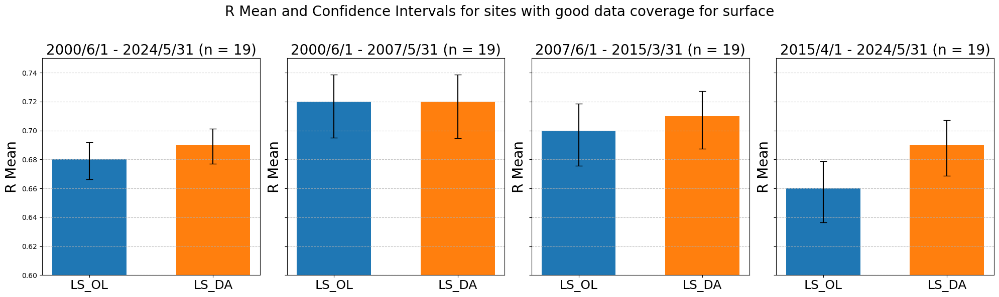

In [33]:
# Calculate and plot for both stats_OL and stats_DA using the same top_indices
datasets = {'OL': stats_OL, 'DA': stats_DA}
depth = 0  # Layer 0
n_ranges = stats_OL['R'].shape[3]  # Number of time ranges
expt_labels = ["LS_OL", "LS_DA"]
range_names = ["2000/6/1 - 2024/5/31", "2000/6/1 - 2007/5/31", "2007/6/1 - 2015/3/31" ,"2015/4/1 - 2024/5/31"]

n_sites = stats_OL['R'].shape[0]
common_mask = np.zeros(n_sites, dtype=bool)

# Start from your balanced site list, if you want to keep that constraint
base_mask = np.zeros(n_sites, dtype=bool)
base_mask[top_balanced_indices_depth0] = True

# Require: site is non-NaN for ALL ranges in BOTH datasets (and all entries along the 3rd axis)
# If the 3rd axis has size >1 (e.g., per-network/per-stat dim), we require no NaNs anywhere in it.
common_mask[:] = base_mask
for stats in datasets.values():
    arr = stats['R'][:, depth, :, :]            # shape: (site, depth=0, K, n_ranges)
    valid_here = np.all(~np.isnan(arr), axis=(1, 2))  # non-NaN across K and all ranges
    common_mask &= valid_here

# Turn mask into indices
common_idx = np.where(common_mask)[0]

# Safety check: if too strict (empty), relax requirement across the 3rd axis to "any"
if common_idx.size == 0:
    for stats in datasets.values():
        arr = stats['anomR'][:, depth, :, :]               # (site, K, n_ranges)
        valid_here = np.all(np.any(~np.isnan(arr), axis=1), axis=1)  # any over K, all ranges
        common_mask = base_mask & valid_here if 'common_mask' not in locals() else (common_mask & valid_here)
    common_idx = np.where(common_mask)[0]

# Prepare figure
fig, axs = plt.subplots(1, n_ranges, figsize=(20, 6), sharey=True)
fig.suptitle('R Mean and Confidence Intervals for sites with good data coverage for surface', fontsize=title_fontsize)

for range_idx in range(n_ranges):
    # range_name = stats_OL['names'][range_idx]
    range_name = range_names[range_idx]

    bar_width = 0.6  # Width of the bars
    x = np.arange(len(expt_labels))  # X positions for the bars

    # Initialize lists to store means and confidence intervals
    means = []
    ci_lows = []
    ci_ups = []

     # n is the SAME for all experiments/ranges by construction
    num_sites_sr = int(common_idx.size)  

    for label, stats in datasets.items():
        R = stats['R']
        RLO = stats['RLO']
        RUP = stats['RUP']

        # Calculate mean and confidence intervals
        R_mean = np.around(np.nanmean(R[common_idx, depth, :, range_idx]), decimals=2)
        R_CI_LO = np.around(np.nanmean(RLO[common_idx, depth, :, range_idx]) / np.sqrt(num_sites_sr), decimals=4)
        R_CI_UP = np.around(np.nanmean(RUP[common_idx, depth, :, range_idx]) / np.sqrt(num_sites_sr), decimals=4)

        means.append(R_mean)
        ci_lows.append(R_CI_LO)
        ci_ups.append(R_CI_UP)

    # Plot bar chart with error bars
    # Combine the absolute values of confidence intervals for yerr
    yerr = np.array([np.abs(ci_lows), np.abs(ci_ups)])
    axs[range_idx].bar(x, means, yerr=yerr, capsize=5, width=bar_width, color=[plt.cm.tab10(i % 10) for i in range(len(means))], label=expt_labels)
    axs[range_idx].set_title(f'{range_name} (n = {num_sites_sr})', fontsize=title_fontsize)
    axs[range_idx].set_xticks(x)
    axs[range_idx].set_xticklabels(expt_labels, fontsize=y_tick_label_fontsize)
    axs[range_idx].set_ylabel('R Mean', fontsize=label_fontsize)
    axs[range_idx].set_ylim(0.6, 0.75)
    axs[range_idx].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()





/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_1756/998826718.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('coolwarm_r', len(levels) - 1)  # Discrete colormap
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_1756/998826718.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.1, 0.15, 1, 1])


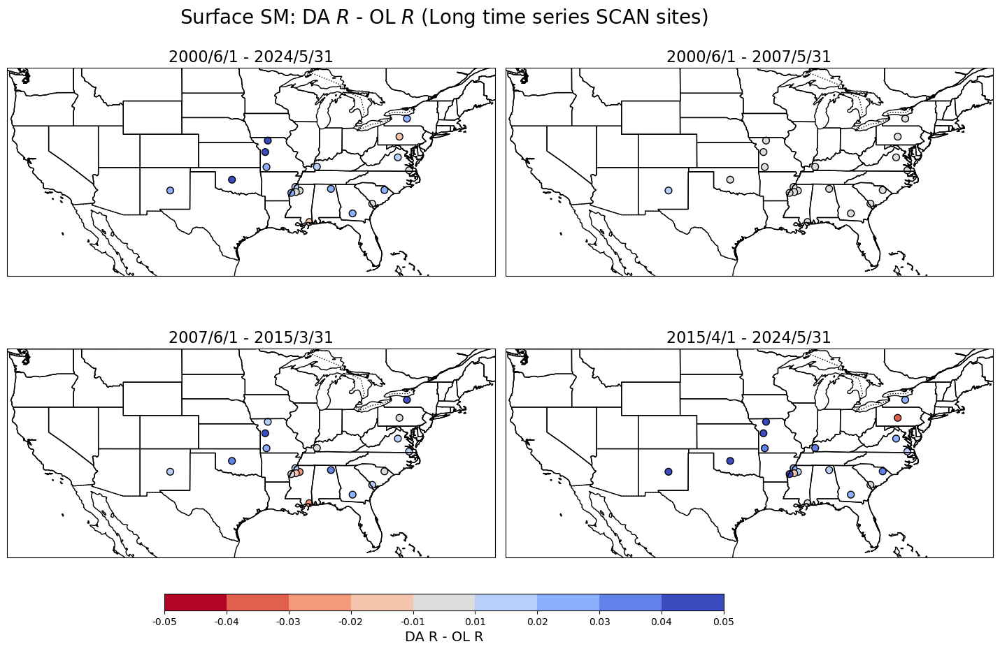

In [34]:
import numpy as np

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Ensure required variables are available
assert 'stats_OL' in globals(), "stats_OL not loaded"
assert 'stats_DA' in globals(), "stats_DA not loaded"
assert 'mat' in globals(), "mat not loaded"

# Extract latitudes and longitudes for common_idx
latitudes = mat['INSITU_lat'].ravel()[common_idx]
longitudes = mat['INSITU_lon'].ravel()[common_idx]

# Extract R values for OL and DA for common_idx
R_OL = stats_OL['R'][common_idx, 0, 0, :]  # Shape: (n_sites, n_ranges)
R_DA = stats_DA['R'][common_idx, 0, 0, :]  # Shape: (n_sites, n_ranges)

# Calculate DA R - OL R for common_idx
R_diff = R_DA - R_OL  # Shape: (n_sites, n_ranges)

# Define range names for titles
range_names = ["2000/6/1 - 2024/5/31", "2000/6/1 - 2007/5/31", "2007/6/1 - 2015/3/31", "2015/4/1 - 2024/5/31"]

# Create the figure and subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.suptitle(r'Surface SM: DA $R$ - OL $R$ (Long time series SCAN sites)', fontsize=20, y=0.92)

# Create a single colorbar axis at the bottom
cbar_ax = fig.add_axes([0.25, 0.2, 0.5, 0.02])  # [left, bottom, width, height]

# Initialize a variable to store the scatter plot for the colorbar
sc = None

# Define discrete color levels
levels = np.linspace(-0.05, 0.05, 10)
cmap = plt.cm.get_cmap('coolwarm_r', len(levels) - 1)  # Discrete colormap

for i, ax in enumerate(axs.flat):
    if i >= R_diff.shape[1]:
        ax.axis('off')  # Turn off unused subplots
        continue

    # Add map features
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.STATES, edgecolor='black')  # Add state boundaries

    # Set extent to show all of CONUS
    ax.set_extent([-125, -66.5, 24, 49], crs=ccrs.PlateCarree())

    # Plot the data for common_idx
    sc = ax.scatter(longitudes, latitudes, c=R_diff[:, i], cmap=cmap, s=50, edgecolor='k', 
                    transform=ccrs.PlateCarree(), vmin=levels[0], vmax=levels[-1])
    ax.set_title(range_names[i], fontsize=16)

# Add a single discrete colorbar
norm = plt.Normalize(vmin=levels[0], vmax=levels[-1])
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax, orientation='horizontal')
cbar.set_label('DA R - OL R', fontsize=14)
cbar.set_ticks(levels)
cbar.ax.set_xticklabels([f"{lvl:.2f}" for lvl in levels])

plt.tight_layout(rect=[0.1, 0.15, 1, 1])
plt.show()


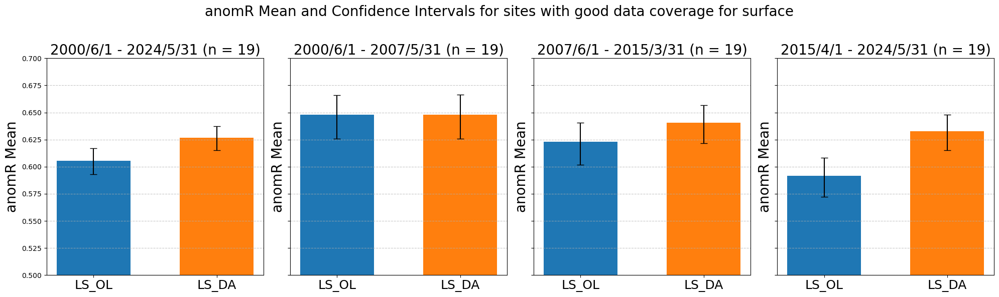

In [35]:
# ---- Build a common site mask across all datasets and time ranges (depth=0) ----
depth = 0
datasets = {'OL': stats_OL, 'DA': stats_DA}

n_sites = stats_OL['anomR'].shape[0]
common_mask = np.zeros(n_sites, dtype=bool)

# Start from your balanced site list, if you want to keep that constraint
base_mask = np.zeros(n_sites, dtype=bool)
base_mask[top_balanced_indices_depth0] = True

# Require: site is non-NaN for ALL ranges in BOTH datasets (and all entries along the 3rd axis)
# If the 3rd axis has size >1 (e.g., per-network/per-stat dim), we require no NaNs anywhere in it.
common_mask[:] = base_mask
for stats in datasets.values():
    arr = stats['anomR'][:, depth, :, :]            # shape: (site, depth=0, K, n_ranges)
    valid_here = np.all(~np.isnan(arr), axis=(1, 2))  # non-NaN across K and all ranges
    common_mask &= valid_here

# Turn mask into indices
common_idx = np.where(common_mask)[0]

# Safety check: if too strict (empty), relax requirement across the 3rd axis to "any"
if common_idx.size == 0:
    for stats in datasets.values():
        arr = stats['anomR'][:, depth, :, :]               # (site, K, n_ranges)
        valid_here = np.all(np.any(~np.isnan(arr), axis=1), axis=1)  # any over K, all ranges
        common_mask = base_mask & valid_here if 'common_mask' not in locals() else (common_mask & valid_here)
    common_idx = np.where(common_mask)[0]

fig, axs = plt.subplots(1, n_ranges, figsize=(20, 6), sharey=True)
fig.suptitle('anomR Mean and Confidence Intervals for sites with good data coverage for surface', fontsize=title_fontsize)

for range_idx in range(n_ranges):
    range_name = range_names[range_idx]
    x = np.arange(len(expt_labels))
    bar_width = 0.6

    means, ci_lows, ci_ups = [], [], []

    # n is identical across experiments/ranges by construction
    num_sites_sr = int(common_idx.size)

    for label, stats in datasets.items():
        anomR   = stats['anomR'][common_idx, depth, :, range_idx]
        anomRLO = stats['anomRLO'][common_idx, depth, :, range_idx]
        anomRUP = stats['anomRUP'][common_idx, depth, :, range_idx]

        # Collapse the extra dim if needed
        vals = np.nanmean(anomR, axis=1) if anomR.ndim == 2 else anomR.ravel()
        lo   = np.nanmean(anomRLO, axis=1) if anomRLO.ndim == 2 else anomRLO.ravel()
        up   = np.nanmean(anomRUP, axis=1) if anomRUP.ndim == 2 else anomRUP.ravel()

        # Mean
        anomR_mean = float(np.nanmean(vals))

        # Error bars (keep your existing approach; or replace with SEM if you prefer)
        anomR_CI_LO = float(np.nanmean(lo) / np.sqrt(max(num_sites_sr, 1)))
        anomR_CI_UP = float(np.nanmean(up) / np.sqrt(max(num_sites_sr, 1)))

        means.append(anomR_mean)
        ci_lows.append(anomR_CI_LO)
        ci_ups.append(anomR_CI_UP)

    yerr = np.array([np.abs(ci_lows), np.abs(ci_ups)])
    axs[range_idx].bar(
        x, means, yerr=yerr, capsize=5, width=bar_width,
        color=[plt.cm.tab10(i % 10) for i in range(len(means))]
    )
    axs[range_idx].set_title(f'{range_name} (n = {num_sites_sr})', fontsize=title_fontsize)
    axs[range_idx].set_xticks(x)
    axs[range_idx].set_xticklabels(expt_labels, fontsize=y_tick_label_fontsize)
    axs[range_idx].set_ylabel('anomR Mean', fontsize=label_fontsize)
    axs[range_idx].set_ylim(0.5, 0.7)
    axs[range_idx].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_1756/1713255738.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('coolwarm_r', len(levels) - 1)  # Discrete colormap
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_1756/1713255738.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.1, 0.15, 1, 1])


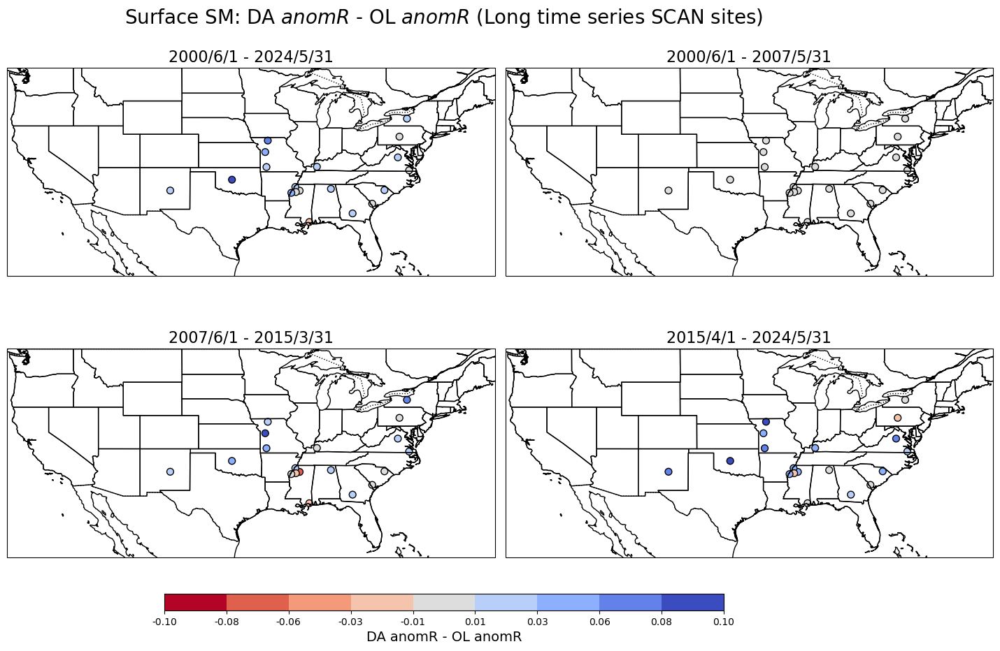

In [36]:
# Extract anomR values for OL and DA for common_idx
anomR_OL = stats_OL['anomR'][common_idx, 0, 0, :]  # Shape: (n_sites, n_ranges)
anomR_DA = stats_DA['anomR'][common_idx, 0, 0, :]  # Shape: (n_sites, n_ranges)

# Extract latitudes and longitudes for common_idx
latitudes = mat['INSITU_lat'].ravel()[common_idx]
longitudes = mat['INSITU_lon'].ravel()[common_idx]

# Calculate DA anomR - OL anomR for common_idx
anomR_diff = anomR_DA - anomR_OL  # Shape: (n_sites, n_ranges)

# Define range names for titles
range_names = ["2000/6/1 - 2024/5/31", "2000/6/1 - 2007/5/31", "2007/6/1 - 2015/3/31", "2015/4/1 - 2024/5/31"]

# Create the figure and subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.suptitle(r'Surface SM: DA $anomR$ - OL $anomR$ (Long time series SCAN sites)', fontsize=20, y=0.92)

# Create a single colorbar axis at the bottom
cbar_ax = fig.add_axes([0.25, 0.2, 0.5, 0.02])  # [left, bottom, width, height]

# Initialize a variable to store the scatter plot for the colorbar
sc = None

# Define discrete color levels
levels = np.linspace(-0.1, 0.1, 10)
cmap = plt.cm.get_cmap('coolwarm_r', len(levels) - 1)  # Discrete colormap

for i, ax in enumerate(axs.flat):
    if i >= anomR_diff.shape[1]:
        ax.axis('off')  # Turn off unused subplots
        continue

    # Add map features
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.STATES, edgecolor='black')  # Add state boundaries

    # Set extent to show all of CONUS
    ax.set_extent([-125, -66.5, 24, 49], crs=ccrs.PlateCarree())

    # Plot the data for common_idx
    sc = ax.scatter(longitudes, latitudes, c=anomR_diff[:, i], cmap=cmap, s=50, edgecolor='k', 
                    transform=ccrs.PlateCarree(), vmin=levels[0], vmax=levels[-1])
    ax.set_title(range_names[i], fontsize=16)

# Add a single discrete colorbar
norm = plt.Normalize(vmin=levels[0], vmax=levels[-1])
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax, orientation='horizontal')
cbar.set_label('DA anomR - OL anomR', fontsize=14)
cbar.set_ticks(levels)
cbar.ax.set_xticklabels([f"{lvl:.2f}" for lvl in levels])

plt.tight_layout(rect=[0.1, 0.15, 1, 1])
plt.show()

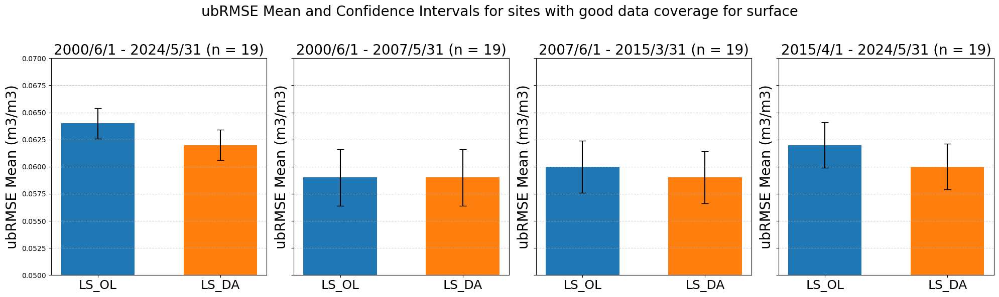

In [37]:
# Calculate and plot for both stats_OL and stats_DA using the same top_indices
datasets = {'OL': stats_OL, 'DA': stats_DA}
depth = 0  # Layer 0
n_ranges = stats_OL['ubRMSE'].shape[3]  # Number of time ranges
expt_labels = ["LS_OL", "LS_DA"]

n_sites = stats_OL['ubRMSE'].shape[0]
common_mask = np.zeros(n_sites, dtype=bool)

# Start from your balanced site list, if you want to keep that constraint
base_mask = np.zeros(n_sites, dtype=bool)
base_mask[top_balanced_indices_depth0] = True

# Require: site is non-NaN for ALL ranges in BOTH datasets (and all entries along the 3rd axis)
# If the 3rd axis has size >1 (e.g., per-network/per-stat dim), we require no NaNs anywhere in it.
common_mask[:] = base_mask
for stats in datasets.values():
    arr = stats['ubRMSE'][:, depth, :, :]            # shape: (site, depth=0, K, n_ranges)
    valid_here = np.all(~np.isnan(arr), axis=(1, 2))  # non-NaN across K and all ranges
    common_mask &= valid_here

# Turn mask into indices
common_idx = np.where(common_mask)[0]

# Safety check: if too strict (empty), relax requirement across the 3rd axis to "any"
if common_idx.size == 0:
    for stats in datasets.values():
        arr = stats['ubRMSE'][:, depth, :, :]               # (site, K, n_ranges)
        valid_here = np.all(np.any(~np.isnan(arr), axis=1), axis=1)  # any over K, all ranges
        common_mask = base_mask & valid_here if 'common_mask' not in locals() else (common_mask & valid_here)
    common_idx = np.where(common_mask)[0]

# Prepare figure
fig, axs = plt.subplots(1, n_ranges, figsize=(20, 6), sharey=True)
fig.suptitle('ubRMSE Mean and Confidence Intervals for sites with good data coverage for surface', fontsize=title_fontsize)

for range_idx in range(n_ranges):
    #range_name = stats_OL['names'][range_idx]
    range_name = range_names[range_idx]
    bar_width = 0.6  # Width of the bars
    x = np.arange(len(expt_labels))  # X positions for the bars

    # Initialize lists to store means and confidence intervals
    means = []
    ci_lows = []
    ci_ups = []

    # n is identical across experiments/ranges by construction
    num_sites_sr = int(common_idx.size)

    for label, stats in datasets.items():
        ubRMSE = stats['ubRMSE']
        ubRMSELO = stats['ubRMSELO']
        ubRMSEUP = stats['ubRMSEUP']

        # Calculate mean and confidence intervals
        ubRMSE_mean = np.around(np.nanmean(ubRMSE[common_idx, depth, :, range_idx]), decimals=3)
        ubRMSE_CI_LO = np.around(np.nanmean(ubRMSELO[common_idx, depth, :, range_idx]) / np.sqrt(num_sites_sr), decimals=4)
        ubRMSE_CI_UP = np.around(np.nanmean(ubRMSEUP[common_idx, depth, :, range_idx]) / np.sqrt(num_sites_sr), decimals=4)

        means.append(ubRMSE_mean)
        ci_lows.append(ubRMSE_CI_LO)
        ci_ups.append(ubRMSE_CI_UP)

    # Plot bar chart with error bars
    # Combine the absolute values of confidence intervals for yerr
    yerr = np.array([np.abs(ci_lows), np.abs(ci_ups)])
    axs[range_idx].bar(x, means, yerr=yerr, capsize=5, width=bar_width, color=[plt.cm.tab10(i % 10) for i in range(len(means))], label=expt_labels)
    axs[range_idx].set_title(f'{range_name} (n = {num_sites_sr})', fontsize=title_fontsize)
    axs[range_idx].set_xticks(x)
    axs[range_idx].set_xticklabels(expt_labels, fontsize=y_tick_label_fontsize)
    axs[range_idx].set_ylabel('ubRMSE Mean (m3/m3)', fontsize=label_fontsize)
    axs[range_idx].set_ylim(0.05, 0.07)
    axs[range_idx].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_1756/1119021383.py:27: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('coolwarm', len(levels) - 1)  # Discrete colormap with reversed colors
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_1756/1119021383.py:54: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0.1, 0.15, 1, 1])


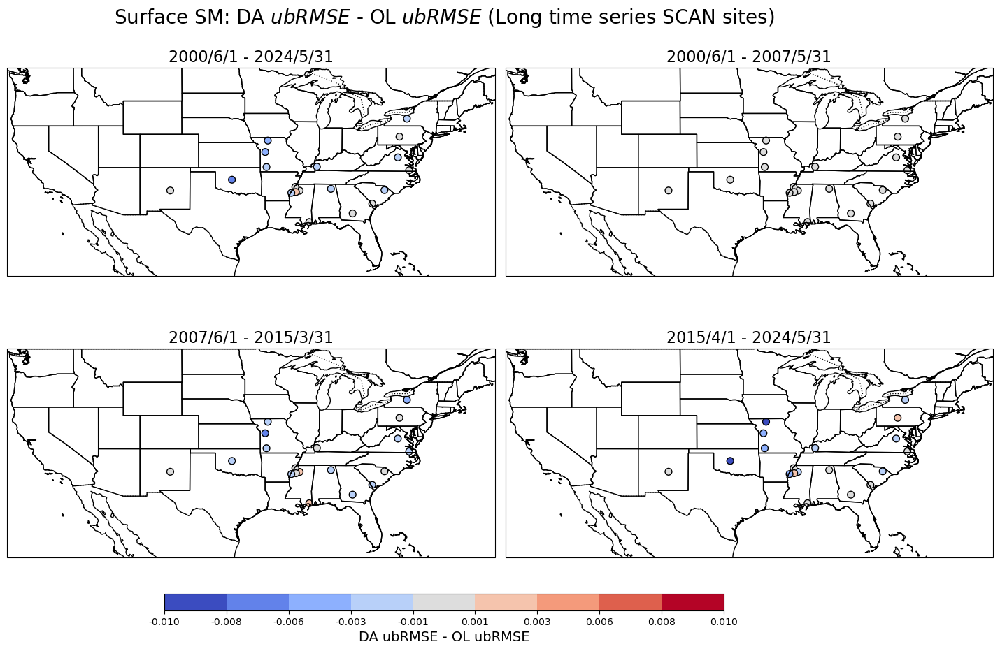

In [38]:
# Extract ubRMSE values for OL and DA for common_idx
ubRMSE_OL = stats_OL['ubRMSE'][common_idx, 0, 0, :]  # Shape: (n_sites, n_ranges)
ubRMSE_DA = stats_DA['ubRMSE'][common_idx, 0, 0, :]  # Shape: (n_sites, n_ranges)

# Extract latitudes and longitudes for common_idx
latitudes = mat['INSITU_lat'].ravel()[common_idx]
longitudes = mat['INSITU_lon'].ravel()[common_idx]

# Calculate DA ubRMSE - OL ubRMSE for common_idx
ubRMSE_diff = ubRMSE_DA - ubRMSE_OL  # Shape: (n_sites, n_ranges)

# Define range names for titles
range_names = ["2000/6/1 - 2024/5/31", "2000/6/1 - 2007/5/31", "2007/6/1 - 2015/3/31", "2015/4/1 - 2024/5/31"]

# Create the figure and subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 12), subplot_kw={'projection': ccrs.PlateCarree()})
fig.suptitle(r'Surface SM: DA $ubRMSE$ - OL $ubRMSE$ (Long time series SCAN sites)', fontsize=20, y=0.92)

# Create a single colorbar axis at the bottom
cbar_ax = fig.add_axes([0.25, 0.2, 0.5, 0.02])  # [left, bottom, width, height]

# Initialize a variable to store the scatter plot for the colorbar
sc = None

# Define discrete color levels
levels = np.linspace(-0.01, 0.01, 10)
cmap = plt.cm.get_cmap('coolwarm', len(levels) - 1)  # Discrete colormap with reversed colors

for i, ax in enumerate(axs.flat):
    if i >= ubRMSE_diff.shape[1]:
        ax.axis('off')  # Turn off unused subplots
        continue

    # Add map features
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.add_feature(cfeature.STATES, edgecolor='black')  # Add state boundaries

    # Set extent to show all of CONUS
    ax.set_extent([-125, -66.5, 24, 49], crs=ccrs.PlateCarree())

    # Plot the data for common_idx
    sc = ax.scatter(longitudes, latitudes, c=ubRMSE_diff[:, i], cmap=cmap, s=50, edgecolor='k', 
                    transform=ccrs.PlateCarree(), vmin=levels[0], vmax=levels[-1])
    ax.set_title(range_names[i], fontsize=16)

# Add a single discrete colorbar
norm = plt.Normalize(vmin=levels[0], vmax=levels[-1])
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax, orientation='horizontal')
cbar.set_label('DA ubRMSE - OL ubRMSE', fontsize=14)
cbar.set_ticks(levels)
cbar.ax.set_xticklabels([f"{lvl:.3f}" for lvl in levels])

plt.tight_layout(rect=[0.1, 0.15, 1, 1])
plt.show()

In [39]:
import pandas as pd

# Initialize an empty list to store the data
table_data = []

# Loop through each site in top_balanced_indices_depth0
for site_idx in top_balanced_indices_depth0:
    # Loop through each time period
    for range_idx, range_name in enumerate(range_names):
        # Extract statistics for OL
        R_OL = stats_OL['R'][site_idx, 0, 0, range_idx]
        anomR_OL = stats_OL['anomR'][site_idx, 0, 0, range_idx]
        ubRMSE_OL = stats_OL['ubRMSE'][site_idx, 0, 0, range_idx]

        # Extract statistics for DA
        R_DA = stats_DA['R'][site_idx, 0, 0, range_idx]
        anomR_DA = stats_DA['anomR'][site_idx, 0, 0, range_idx]
        ubRMSE_DA = stats_DA['ubRMSE'][site_idx, 0, 0, range_idx]

        # Append the data to the list
        table_data.append({
            'Site': site_idx,
            'Time Period': range_name,
            'R_OL': R_OL,
            'anomR_OL': anomR_OL,
            'ubRMSE_OL': ubRMSE_OL,
            'R_DA': R_DA,
            'anomR_DA': anomR_DA,
            'ubRMSE_DA': ubRMSE_DA
        })

# Convert the list to a DataFrame
results_table = pd.DataFrame(table_data)

# Display the table
print(results_table)

# Optionally, save the table to a CSV file
results_table.to_csv('statistics_table.csv', index=False)

    Site           Time Period      R_OL  anomR_OL  ubRMSE_OL      R_DA  \
0      2  2000/6/1 - 2024/5/31  0.708084  0.651917   0.065411  0.719442   
1      2  2000/6/1 - 2007/5/31  0.758952  0.545434   0.055923  0.760273   
2      2  2007/6/1 - 2015/3/31  0.766147  0.806999   0.063410  0.765977   
3      2  2015/4/1 - 2024/5/31  0.498452  0.464588   0.073892  0.526745   
4      8  2000/6/1 - 2024/5/31  0.654405  0.538565   0.059727  0.682012   
..   ...                   ...       ...       ...        ...       ...   
71    50  2015/4/1 - 2024/5/31  0.726662  0.717864   0.085344  0.772617   
72    63  2000/6/1 - 2024/5/31  0.670337  0.628361   0.056844  0.656043   
73    63  2000/6/1 - 2007/5/31  0.767770  0.761062   0.044129  0.768579   
74    63  2007/6/1 - 2015/3/31  0.755812  0.718354   0.054159  0.738210   
75    63  2015/4/1 - 2024/5/31  0.532400  0.389880   0.063654  0.531061   

    anomR_DA  ubRMSE_DA  
0   0.672771   0.064151  
1   0.543145   0.055858  
2   0.816499   0.0634

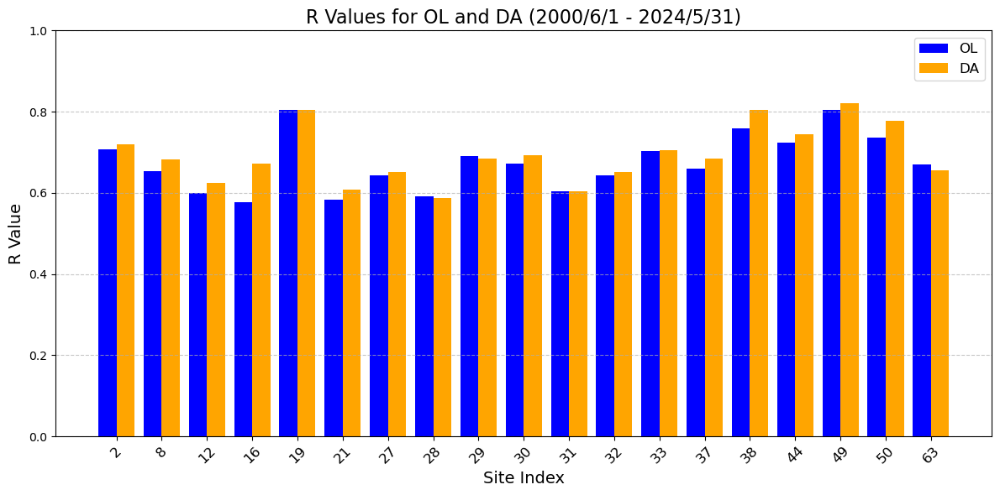

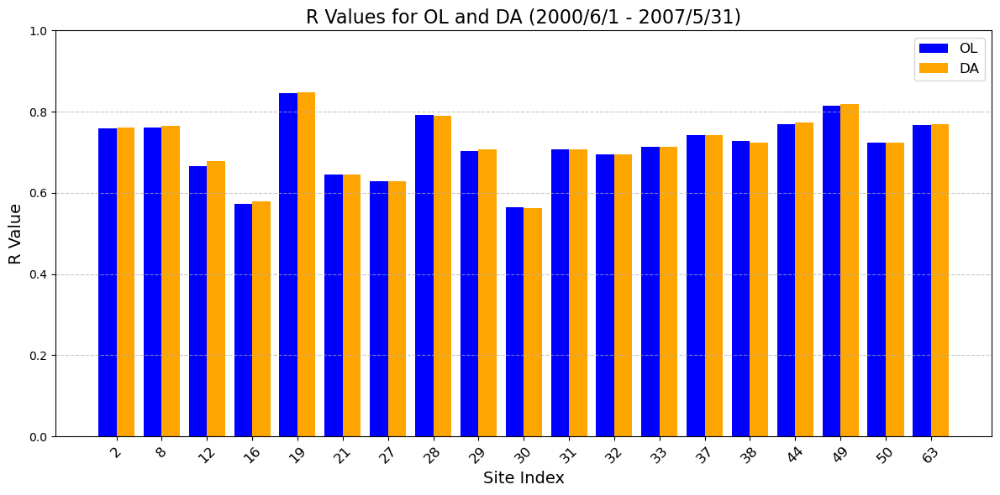

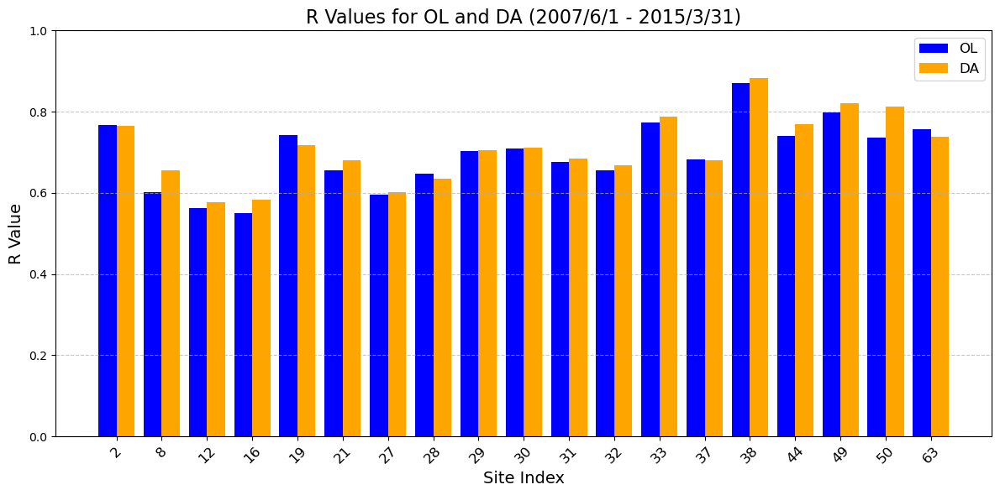

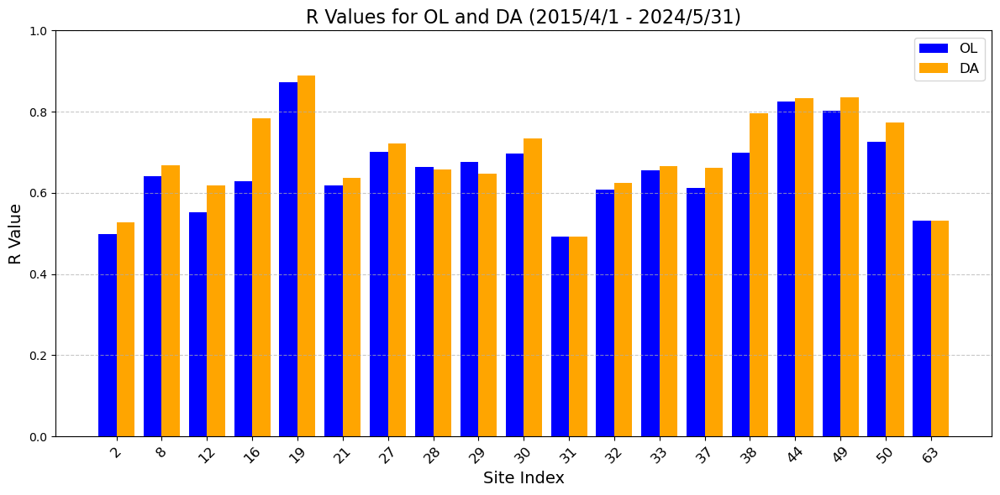

In [40]:
# Prepare figure properties
time_periods = ["2000/6/1 - 2024/5/31", "2000/6/1 - 2007/5/31", "2007/6/1 - 2015/3/31", "2015/4/1 - 2024/5/31"]
colors = ['blue', 'orange']

# Loop through each time period
for period_idx, period_name in enumerate(time_periods):
    # Extract R values for OL and DA for the current time period
    R_OL_values = [entry['R_OL'] for entry in table_data if entry['Time Period'] == period_name]
    R_DA_values = [entry['R_DA'] for entry in table_data if entry['Time Period'] == period_name]
    site_indices = [entry['Site'] for entry in table_data if entry['Time Period'] == period_name]

    # Create the bar chart
    x = np.arange(len(site_indices))  # X positions for the bars
    bar_width = 0.4

    plt.figure(figsize=(12, 6))
    plt.bar(x - bar_width / 2, R_OL_values, bar_width, label='OL', color=colors[0])
    plt.bar(x + bar_width / 2, R_DA_values, bar_width, label='DA', color=colors[1])

    # Add labels, title, and legend
    plt.xlabel('Site Index', fontsize=14)
    plt.ylabel('R Value', fontsize=14)
    plt.title(f'R Values for OL and DA ({period_name})', fontsize=16)
    plt.xticks(x, site_indices, rotation=45, fontsize=12)
    plt.ylim(0, 1)
    plt.legend(fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Show the plot
    plt.tight_layout()
    plt.show()

In [41]:
# --- Config ---
depth = 1                      # 0=surface, 1=rootzone
min_days_per_period = 500

# Reuse your existing periods (same as earlier cell)
periods = [
    ("P1", datetime(2000, 6, 1).date(), datetime(2007, 6, 1).date()),   # [start, end)
    ("P2", datetime(2007, 6, 1).date(), datetime(2015, 4, 1).date()),   # [start, end)
    ("P3", datetime(2015, 4, 1).date(), datetime(2024, 6, 30).date()),  # inclusive end
]

qualified = []   # list of (site_idx, site_id, P1, P2, P3, total)

for j in range(n_sites):
    days = unique_days[depth][j]
    if days is None or len(days) == 0:
        continue
    days = np.asarray(days)  # ensure numpy array of datetime.date

    # Count using same inclusivity as your previous code
    counts = np.array([
        np.count_nonzero((days >= p[1]) & (days < p[2])) if i < 2
        else np.count_nonzero((days >= p[1]) & (days <= p[2]))  # P3 inclusive end
        for i, p in enumerate(periods)
    ], dtype=int)

    if np.all(counts >= min_days_per_period):
        sid = ids[j] if j < len(ids) else str(j)
        qualified.append((j, sid, counts[0], counts[1], counts[2], int(counts.sum())))

print(f"Sites with ≥{min_days_per_period} days in EACH period at depth {depth}: {len(qualified)}")

# Pretty print a few (or all)
for rank, (j, sid, c1, c2, c3, tot) in enumerate(qualified[:50], start=1):
    print(f"{rank:2d}. site {j:4d} ({sid}): P1={c1}, P2={c2}, P3={c3}, total={tot}")

# Extract just the site indices from qualified list
qualified_indices = [q[0] for q in qualified]    

top_balanced_indices_depth1 = qualified_indices


Sites with ≥500 days in EACH period at depth 1: 18
 1. site   10 (2013): P1=515, P2=1603, P3=1228, total=3346
 2. site   20 (2026): P1=870, P2=1149, P3=2567, total=4586
 3. site   21 (2027): P1=1804, P2=1404, P3=1403, total=4611
 4. site   22 (2028): P1=1673, P2=1560, P3=720, total=3953
 5. site   28 (2035): P1=1939, P2=2362, P3=1739, total=6040
 6. site   30 (2037): P1=731, P2=1421, P3=1446, total=3598
 7. site   31 (2038): P1=826, P2=1156, P3=587, total=2569
 8. site   32 (2039): P1=1766, P2=1996, P3=2615, total=6377
 9. site   33 (2040): P1=1806, P2=1176, P3=1113, total=4095
10. site   34 (2041): P1=622, P2=843, P3=1119, total=2584
11. site   38 (2047): P1=1322, P2=587, P3=1193, total=3102
12. site   40 (2049): P1=569, P2=1615, P3=1173, total=3357
13. site   44 (2055): P1=895, P2=1183, P3=1881, total=3959
14. site   52 (2068): P1=592, P2=775, P3=1749, total=3116
15. site   60 (2077): P1=786, P2=2412, P3=2477, total=5675
16. site   63 (2082): P1=861, P2=1856, P3=1204, total=3921
17. 

Range 2000/6/1 - 2024/5/31: n_sites_sr = 18
Range 2000/6/1 - 2007/5/31: n_sites_sr = 18
Range 2007/6/1 - 2015/3/31: n_sites_sr = 18
Range 2015/4/1 - 2024/5/31: n_sites_sr = 18


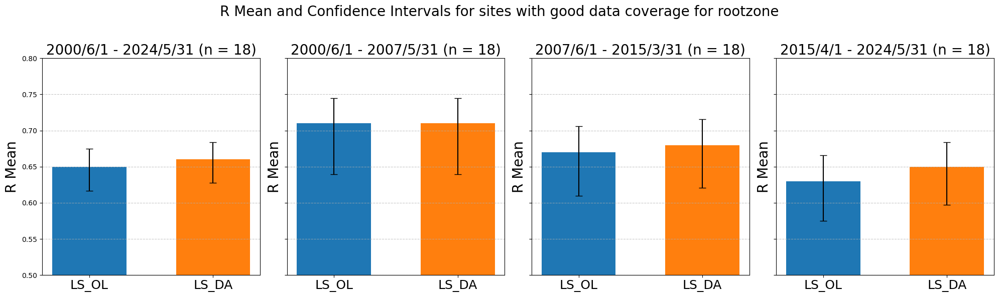

In [42]:
# Calculate and plot for both stats_OL and stats_DA using the same top_indices
datasets = {'OL': stats_OL, 'DA': stats_DA}
depth = 1  # Layer 1
n_ranges = stats_OL['R'].shape[3]  # Number of time ranges
expt_labels = ["LS_OL", "LS_DA"]
range_names = ["2000/6/1 - 2024/5/31", "2000/6/1 - 2007/5/31", "2007/6/1 - 2015/3/31" ,"2015/4/1 - 2024/5/31"]

n_sites = stats_OL['R'].shape[0]
common_mask = np.zeros(n_sites, dtype=bool)

# Start from your balanced site list, if you want to keep that constraint
base_mask = np.zeros(n_sites, dtype=bool)
base_mask[top_balanced_indices_depth1] = True

# Require: site is non-NaN for ALL ranges in BOTH datasets (and all entries along the 3rd axis)
# If the 3rd axis has size >1 (e.g., per-network/per-stat dim), we require no NaNs anywhere in it.
common_mask[:] = base_mask
for stats in datasets.values():
    arr = stats['R'][:, depth, :, :]            # shape: (site, depth=0, K, n_ranges)
    valid_here = np.all(~np.isnan(arr), axis=(1, 2))  # non-NaN across K and all ranges
    common_mask &= valid_here

# Turn mask into indices
common_idx = np.where(common_mask)[0]

# Safety check: if too strict (empty), relax requirement across the 3rd axis to "any"
if common_idx.size == 0:
    for stats in datasets.values():
        arr = stats['R'][:, depth, :, :]               # (site, K, n_ranges)
        valid_here = np.all(np.any(~np.isnan(arr), axis=1), axis=1)  # any over K, all ranges
        common_mask = base_mask & valid_here if 'common_mask' not in locals() else (common_mask & valid_here)
    common_idx = np.where(common_mask)[0]

# Prepare figure
fig, axs = plt.subplots(1, n_ranges, figsize=(20, 6), sharey=True)
fig.suptitle('R Mean and Confidence Intervals for sites with good data coverage for rootzone', fontsize=title_fontsize)

for range_idx in range(n_ranges):
    # range_name = stats_OL['names'][range_idx]
    range_name = range_names[range_idx]

    bar_width = 0.6  # Width of the bars
    x = np.arange(len(expt_labels))  # X positions for the bars

    # Initialize lists to store means and confidence intervals
    means = []
    ci_lows = []
    ci_ups = []

    # n is the SAME for all experiments/ranges by construction
    num_sites_sr = int(common_idx.size)
    print(f"Range {range_name}: n_sites_sr = {num_sites_sr}")

    for label, stats in datasets.items():
        R = stats['R']
        RLO = stats['RLO']
        RUP = stats['RUP']

        # Calculate mean and confidence intervals
        R_mean = np.around(np.nanmean(R[common_idx, depth, :, range_idx]), decimals=2)
        R_CI_LO = np.around(np.nanmean(RLO[common_idx, depth, :, range_idx]) / np.sqrt(num_sites_sr), decimals=4)
        R_CI_UP = np.around(np.nanmean(RUP[common_idx, depth, :, range_idx]) / np.sqrt(num_sites_sr), decimals=4)

        means.append(R_mean)
        ci_lows.append(R_CI_LO)
        ci_ups.append(R_CI_UP)

    # Plot bar chart with error bars
    # Combine the absolute values of confidence intervals for yerr
    yerr = np.array([np.abs(ci_lows), np.abs(ci_ups)])
    axs[range_idx].bar(x, means, yerr=yerr, capsize=5, width=bar_width, color=[plt.cm.tab10(i % 10) for i in range(len(means))], label=expt_labels)
    axs[range_idx].set_title(f'{range_name} (n = {num_sites_sr})', fontsize=title_fontsize)
    axs[range_idx].set_xticks(x)
    axs[range_idx].set_xticklabels(expt_labels, fontsize=y_tick_label_fontsize)
    axs[range_idx].set_ylabel('R Mean', fontsize=label_fontsize)
    axs[range_idx].set_ylim(0.5, 0.8)
    axs[range_idx].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

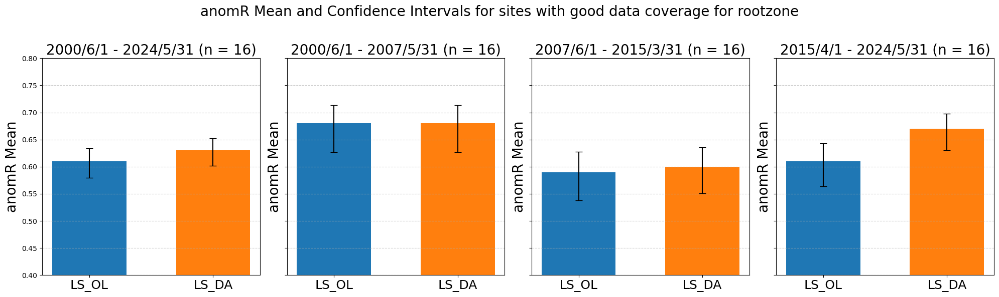

In [43]:
# Calculate and plot for both stats_OL and stats_DA using the same top_indices
datasets = {'OL': stats_OL, 'DA': stats_DA}
depth = 1  # Layer 0
n_ranges = stats_OL['anomR'].shape[3]  # Number of time ranges
expt_labels = ["LS_OL", "LS_DA"]

n_sites = stats_OL['anomR'].shape[0]
common_mask = np.zeros(n_sites, dtype=bool)

# Start from your balanced site list, if you want to keep that constraint
base_mask = np.zeros(n_sites, dtype=bool)
base_mask[top_balanced_indices_depth1] = True

# Require: site is non-NaN for ALL ranges in BOTH datasets (and all entries along the 3rd axis)
# If the 3rd axis has size >1 (e.g., per-network/per-stat dim), we require no NaNs anywhere in it.
common_mask[:] = base_mask
for stats in datasets.values():
    arr = stats['anomR'][:, depth, :, :]            # shape: (site, depth=0, K, n_ranges)
    valid_here = np.all(~np.isnan(arr), axis=(1, 2))  # non-NaN across K and all ranges
    common_mask &= valid_here

# Turn mask into indices
common_idx = np.where(common_mask)[0]

# Safety check: if too strict (empty), relax requirement across the 3rd axis to "any"
if common_idx.size == 0:
    for stats in datasets.values():
        arr = stats['anomR'][:, depth, :, :]               # (site, K, n_ranges)
        valid_here = np.all(np.any(~np.isnan(arr), axis=1), axis=1)  # any over K, all ranges
        common_mask = base_mask & valid_here if 'common_mask' not in locals() else (common_mask & valid_here)
    common_idx = np.where(common_mask)[0]

# Prepare figure
fig, axs = plt.subplots(1, n_ranges, figsize=(20, 6), sharey=True)
fig.suptitle('anomR Mean and Confidence Intervals for sites with good data coverage for rootzone', fontsize=title_fontsize)

for range_idx in range(n_ranges):
    #range_name = stats_OL['names'][range_idx]
    range_name = range_names[range_idx]
    bar_width = 0.6  # Width of the bars
    x = np.arange(len(expt_labels))  # X positions for the bars

    # Initialize lists to store means and confidence intervals
    means = []
    ci_lows = []
    ci_ups = []

    # n is the SAME for all experiments/ranges by construction
    num_sites_sr = int(common_idx.size)  

    for label, stats in datasets.items():
        anomR = stats['anomR']
        anomRLO = stats['anomRLO']
        anomRUP = stats['anomRUP']

        # Calculate mean and confidence intervals
        anomR_mean = np.around(np.nanmean(anomR[common_idx, depth, :, range_idx]), decimals=2)
        anomR_CI_LO = np.around(np.nanmean(anomRLO[common_idx, depth, :, range_idx]) / np.sqrt(num_sites_sr), decimals=4)
        anomR_CI_UP = np.around(np.nanmean(anomRUP[common_idx, depth, :, range_idx]) / np.sqrt(num_sites_sr), decimals=4)

        means.append(anomR_mean)
        ci_lows.append(anomR_CI_LO)
        ci_ups.append(anomR_CI_UP)

    # Plot bar chart with error bars
    # Combine the absolute values of confidence intervals for yerr
    yerr = np.array([np.abs(ci_lows), np.abs(ci_ups)])
    axs[range_idx].bar(x, means, yerr=yerr, capsize=5, width=bar_width, color=[plt.cm.tab10(i % 10) for i in range(len(means))], label=expt_labels)
    axs[range_idx].set_title(f'{range_name} (n = {num_sites_sr})', fontsize=title_fontsize)
    axs[range_idx].set_xticks(x)
    axs[range_idx].set_xticklabels(expt_labels, fontsize=y_tick_label_fontsize)
    axs[range_idx].set_ylabel('anomR Mean', fontsize=label_fontsize)
    axs[range_idx].set_ylim(0.4, 0.8)
    axs[range_idx].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

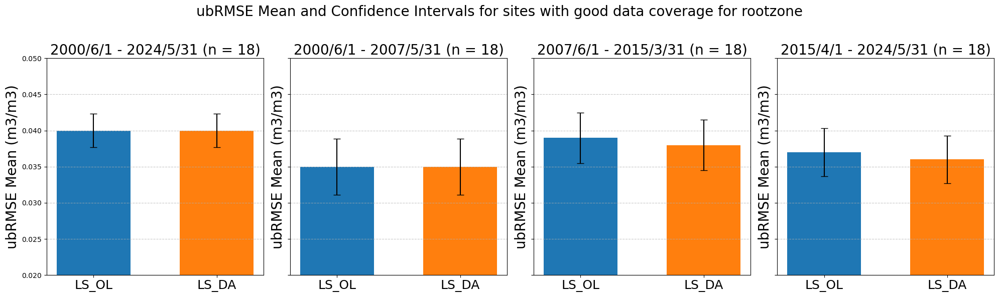

In [44]:
# Calculate and plot for both stats_OL and stats_DA using the same top_indices
datasets = {'OL': stats_OL, 'DA': stats_DA}
depth = 1  # Layer 0
n_ranges = stats_OL['ubRMSE'].shape[3]  # Number of time ranges
expt_labels = ["LS_OL", "LS_DA"]

n_sites = stats_OL['ubRMSE'].shape[0]
common_mask = np.zeros(n_sites, dtype=bool)

# Start from your balanced site list, if you want to keep that constraint
base_mask = np.zeros(n_sites, dtype=bool)
base_mask[top_balanced_indices_depth1] = True

# Require: site is non-NaN for ALL ranges in BOTH datasets (and all entries along the 3rd axis)
# If the 3rd axis has size >1 (e.g., per-network/per-stat dim), we require no NaNs anywhere in it.
common_mask[:] = base_mask
for stats in datasets.values():
    arr = stats['ubRMSE'][:, depth, :, :]            # shape: (site, depth=0, K, n_ranges)
    valid_here = np.all(~np.isnan(arr), axis=(1, 2))  # non-NaN across K and all ranges
    common_mask &= valid_here

# Turn mask into indices
common_idx = np.where(common_mask)[0]

# Safety check: if too strict (empty), relax requirement across the 3rd axis to "any"
if common_idx.size == 0:
    for stats in datasets.values():
        arr = stats['ubRMSE'][:, depth, :, :]               # (site, K, n_ranges)
        valid_here = np.all(np.any(~np.isnan(arr), axis=1), axis=1)  # any over K, all ranges
        common_mask = base_mask & valid_here if 'common_mask' not in locals() else (common_mask & valid_here)
    common_idx = np.where(common_mask)[0]

# Prepare figure
fig, axs = plt.subplots(1, n_ranges, figsize=(20, 6), sharey=True)
fig.suptitle('ubRMSE Mean and Confidence Intervals for sites with good data coverage for rootzone', fontsize=title_fontsize)

for range_idx in range(n_ranges):
    #range_name = stats_OL['names'][range_idx]
    range_name = range_names[range_idx]
    bar_width = 0.6  # Width of the bars
    x = np.arange(len(expt_labels))  # X positions for the bars

    # Initialize lists to store means and confidence intervals
    means = []
    ci_lows = []
    ci_ups = []

    # n is the SAME for all experiments/ranges by construction
    num_sites_sr = int(common_idx.size)  

    for label, stats in datasets.items():
        ubRMSE = stats['ubRMSE']
        ubRMSELO = stats['ubRMSELO']
        ubRMSEUP = stats['ubRMSEUP']

        # Calculate mean and confidence intervals
        ubRMSE_mean = np.around(np.nanmean(ubRMSE[common_idx, depth, :, range_idx]), decimals=3)
        ubRMSE_CI_LO = np.around(np.nanmean(ubRMSELO[common_idx, depth, :, range_idx]) / np.sqrt(num_sites_sr), decimals=4)
        ubRMSE_CI_UP = np.around(np.nanmean(ubRMSEUP[common_idx, depth, :, range_idx]) / np.sqrt(num_sites_sr), decimals=4)

        means.append(ubRMSE_mean)
        ci_lows.append(ubRMSE_CI_LO)
        ci_ups.append(ubRMSE_CI_UP)

    # Plot bar chart with error bars
    # Combine the absolute values of confidence intervals for yerr
    yerr = np.array([np.abs(ci_lows), np.abs(ci_ups)])
    axs[range_idx].bar(x, means, yerr=yerr, capsize=5, width=bar_width, color=[plt.cm.tab10(i % 10) for i in range(len(means))], label=expt_labels)
    axs[range_idx].set_title(f'{range_name} (n = {num_sites_sr})', fontsize=title_fontsize)
    axs[range_idx].set_xticks(x)
    axs[range_idx].set_xticklabels(expt_labels, fontsize=y_tick_label_fontsize)
    axs[range_idx].set_ylabel('ubRMSE Mean (m3/m3)', fontsize=label_fontsize)
    axs[range_idx].set_ylim(0.02, 0.05)
    axs[range_idx].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

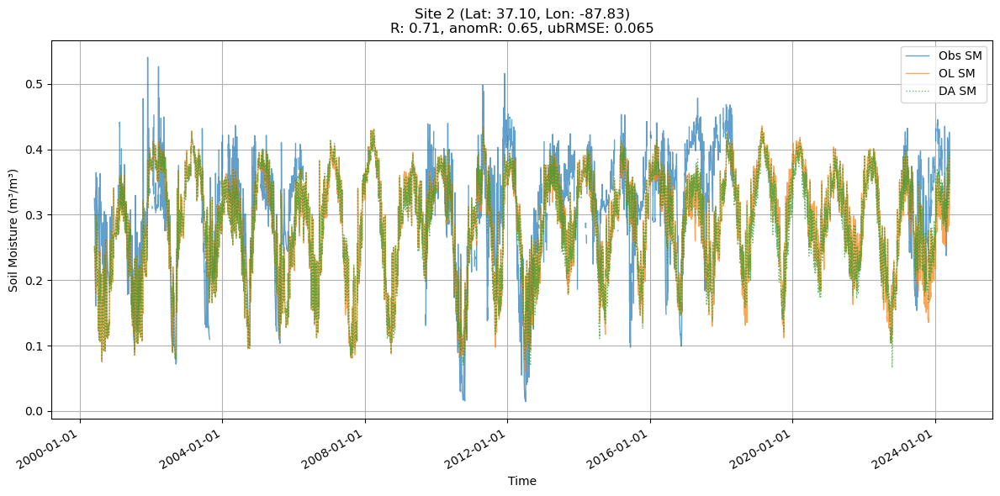

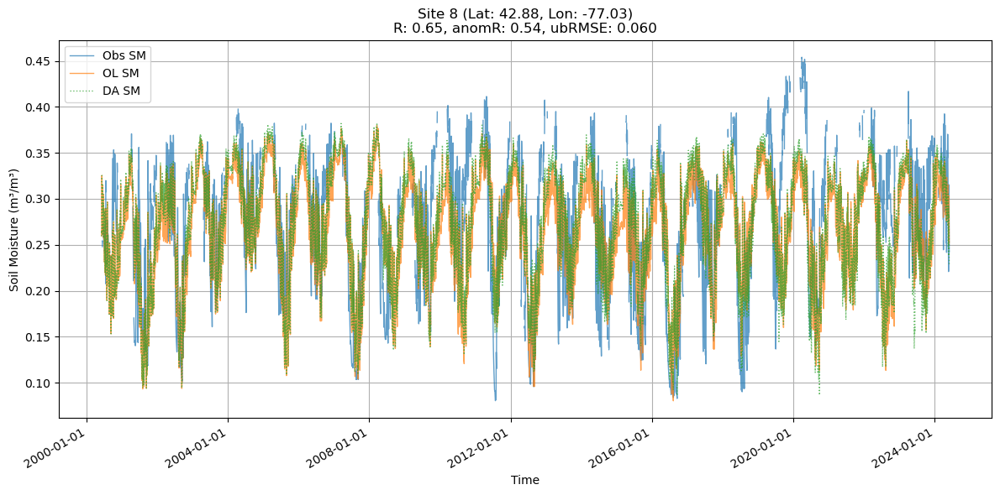

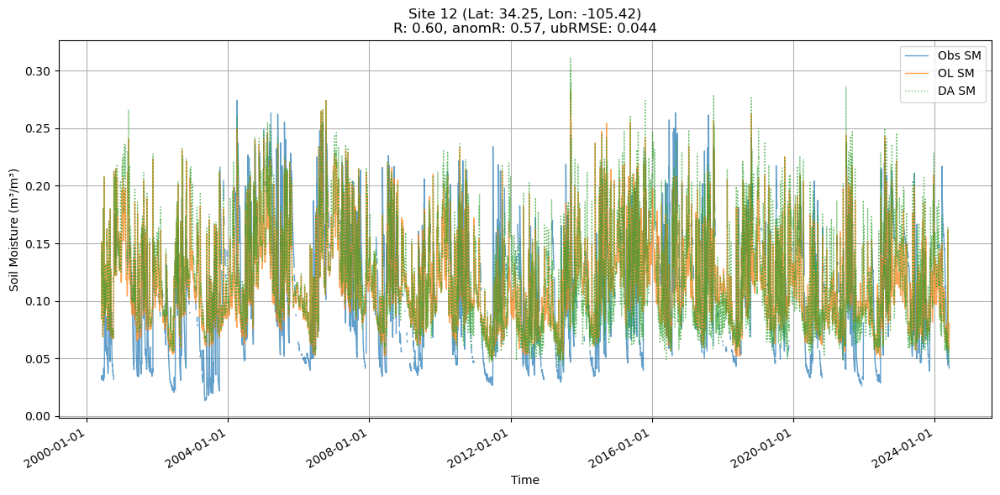

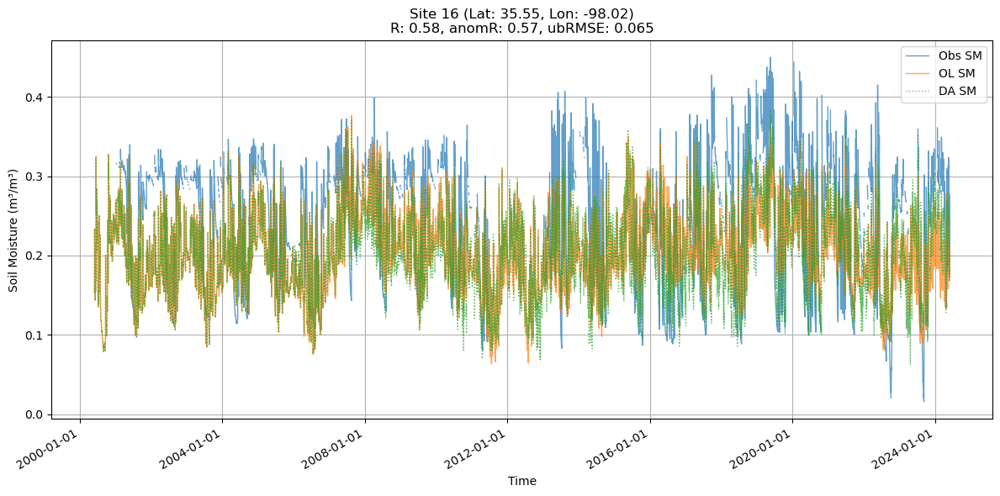

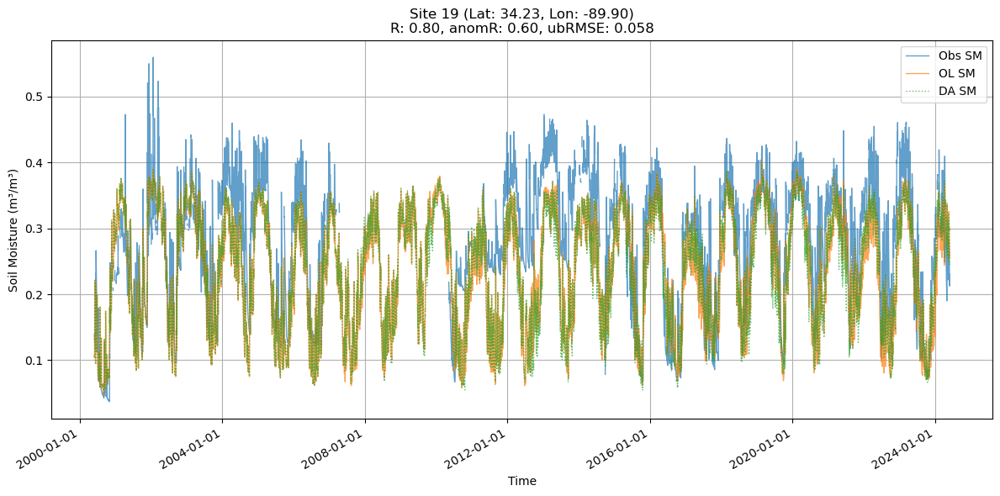

...

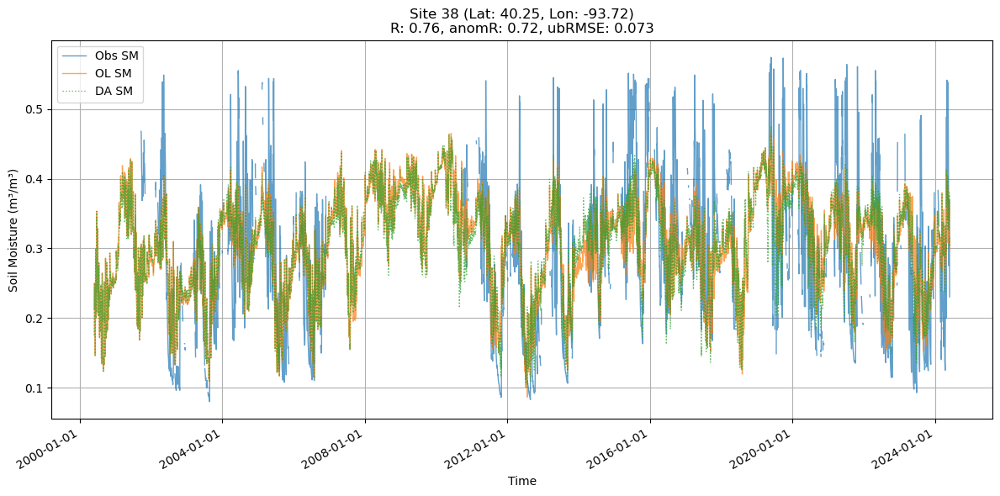

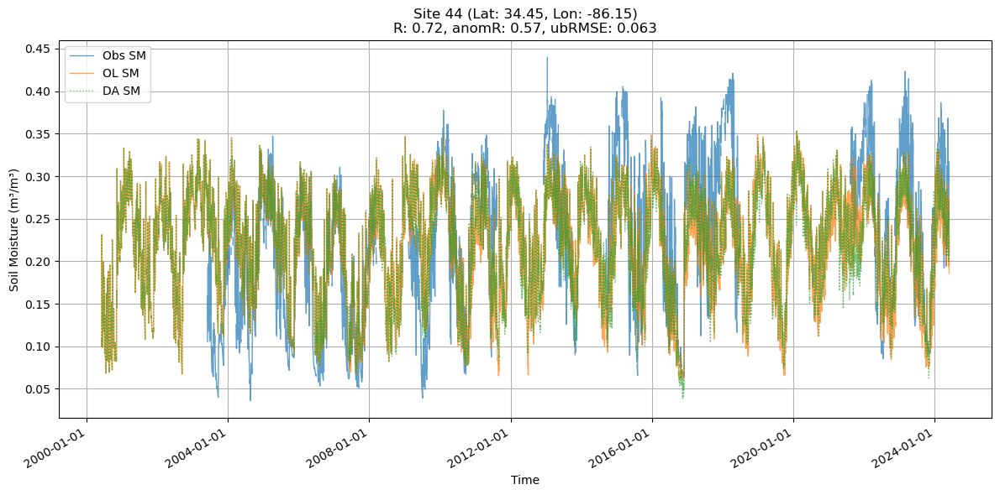

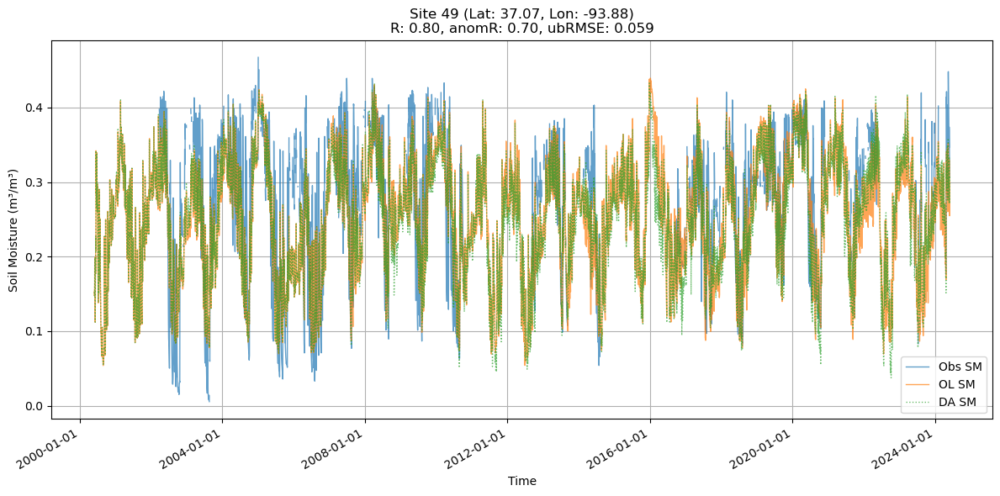

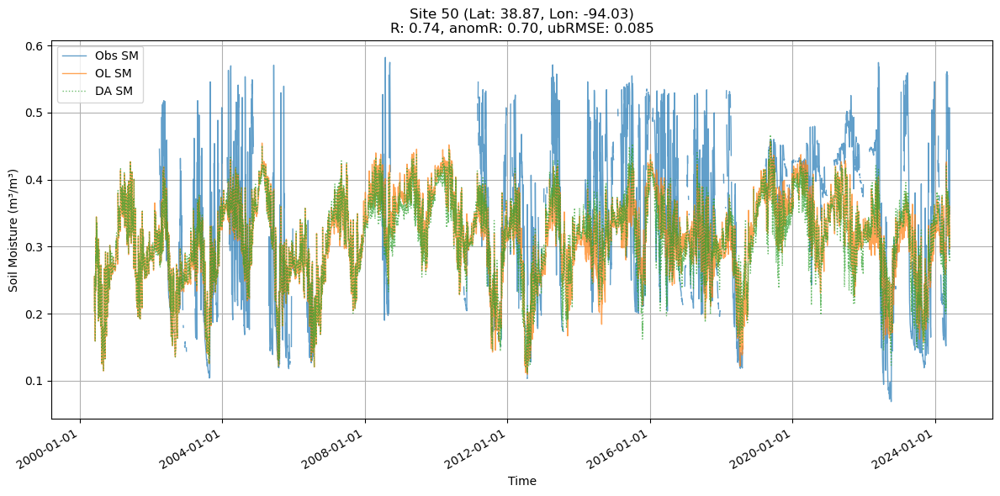

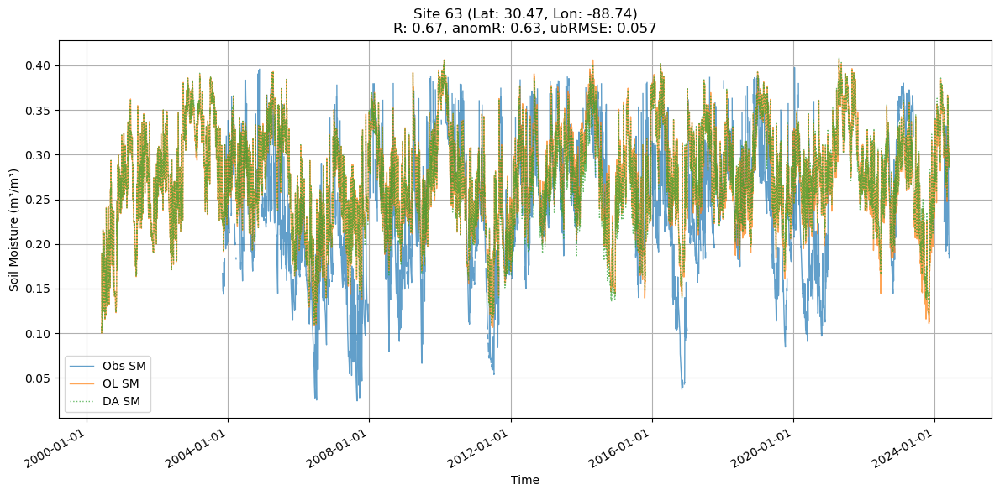

In [45]:
m_rs_file = '/Users/amfox/Desktop/GEOSldas_diagnostics/test_data/M21C_land_sweeper_v2/LS_DAv8_M36_SCAN_SM_1d_c1234smv_25yr_raw_timeseries.mat'
mat_contents = sio.loadmat(m_rs_file)

LDAS_sm_DA = mat_contents.get('LDAS_sm_org')

# Ensure required variables are available
assert 'INSITU_sm' in globals(), "INSITU_sm not loaded"
assert 'LDAS_sm_OL' in globals(), "LDAS_sm_org not loaded"
assert 'timestamps_arr' in globals(), "timestamps_arr not available"
assert 'top_balanced_indices_depth0' in globals(), "top_balanced_indices_depth0 not available"
assert 'stats_OL' in globals(), "stats_OL not loaded"
assert 'stats_DA' in globals(), "stats_DA not loaded"

# Loop through each site in top_balanced_indices_depth0
for site_idx in top_balanced_indices_depth0:
    # Extract observed and modeled soil moisture for the site
    observed_sm = INSITU_sm[:, 0, site_idx]  # Observed soil moisture (depth 0)
    modeled_sm_OL = LDAS_sm_OL[:, 0, site_idx]  # Modeled soil moisture (depth 0)
    modeled_sm_DA = LDAS_sm_DA[:, 0, site_idx]  # Modeled soil moisture (depth 0)

    # Extract latitude and longitude
    lat = mat['INSITU_lat'][site_idx, 0]
    lon = mat['INSITU_lon'][site_idx, 0]

    # Extract R, anomR, and ubRMSE values for the site
    R_value = stats_OL['R'][site_idx, 0, 0, 0]  # R for the first range
    anomR_value = stats_OL['anomR'][site_idx, 0, 0, 0]  # anomR for the first range
    ubRMSE_value = stats_OL['ubRMSE'][site_idx, 0, 0, 0]  # ubRMSE for the first range

    # Create the plot
    plt.figure(figsize=(12, 6))
    plt.plot(timestamps_arr, observed_sm, label='Obs SM', alpha=0.7, linewidth=1)
    plt.plot(timestamps_arr, modeled_sm_OL, label='OL SM', alpha=0.7, linewidth=1)
    plt.plot(timestamps_arr, modeled_sm_DA, ':', label='DA SM', alpha=0.7, linewidth=1)
    plt.xlabel('Time')
    plt.ylabel('Soil Moisture (m³/m³)')
    plt.title(f"Site {site_idx} (Lat: {lat:.2f}, Lon: {lon:.2f})\n"
              f"R: {R_value:.2f}, anomR: {anomR_value:.2f}, ubRMSE: {ubRMSE_value:.3f}")
    plt.legend()
    plt.grid(True)
    ax = plt.gca()
    ax.xaxis.set_major_locator(AutoDateLocator())
    ax.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    plt.show()

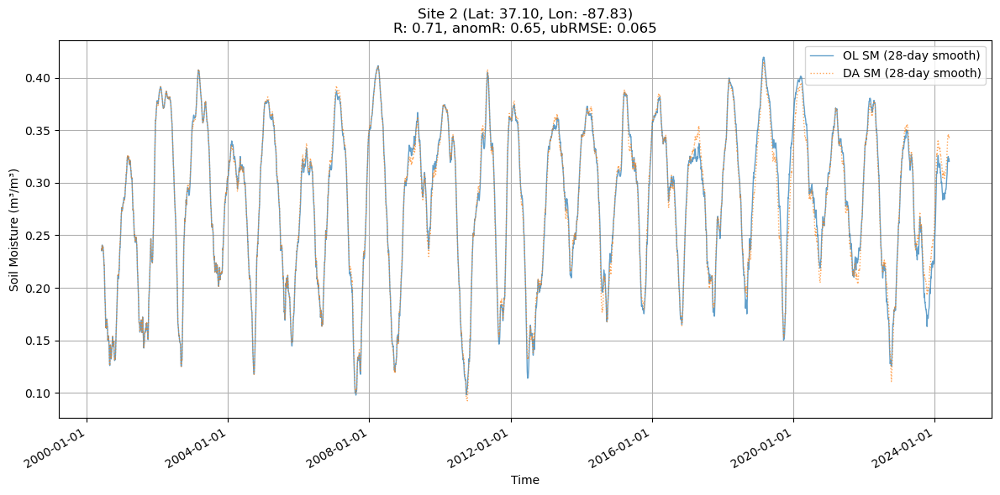

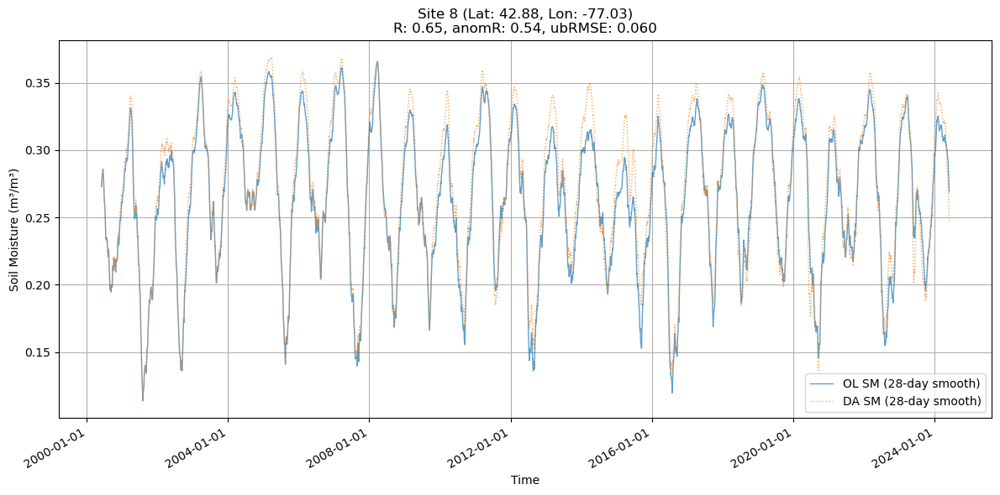

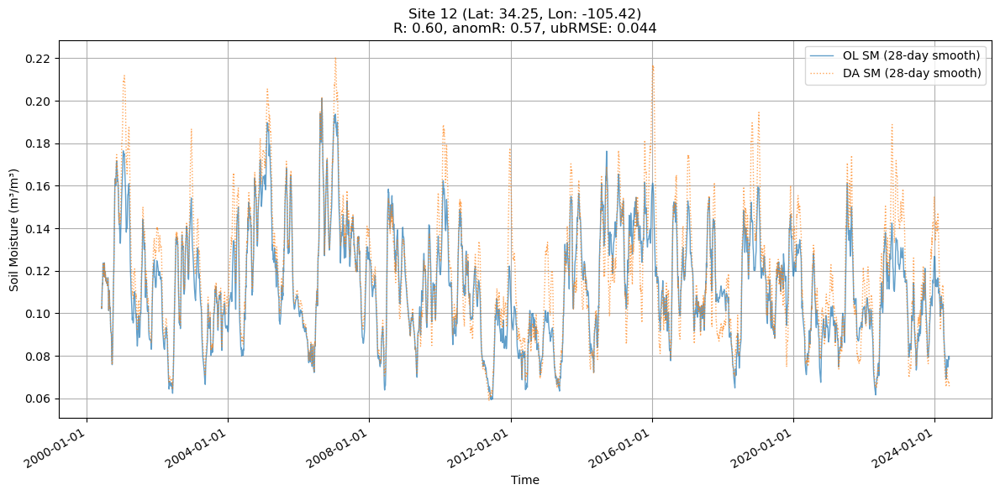

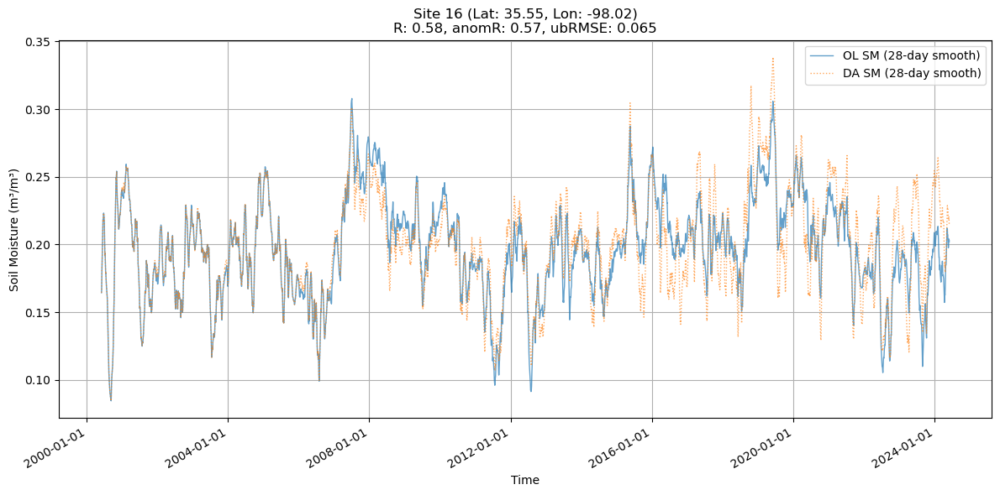

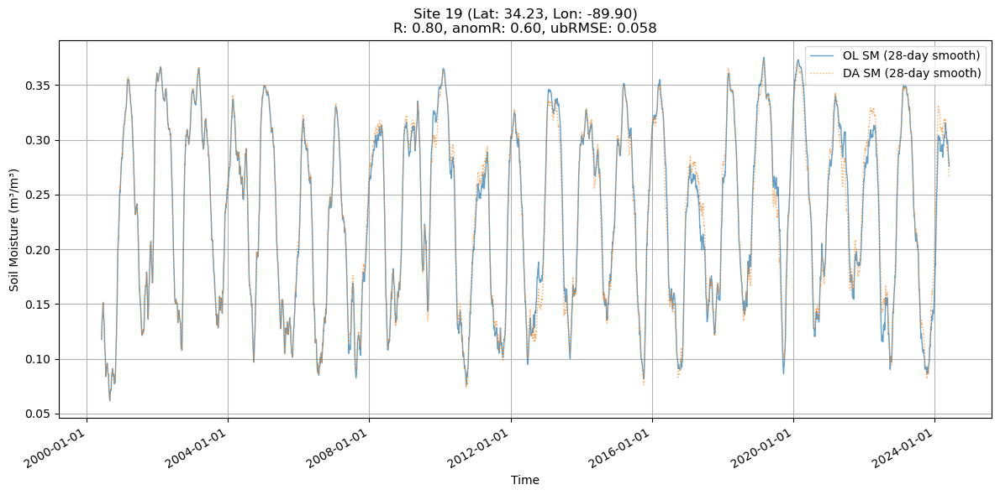

...

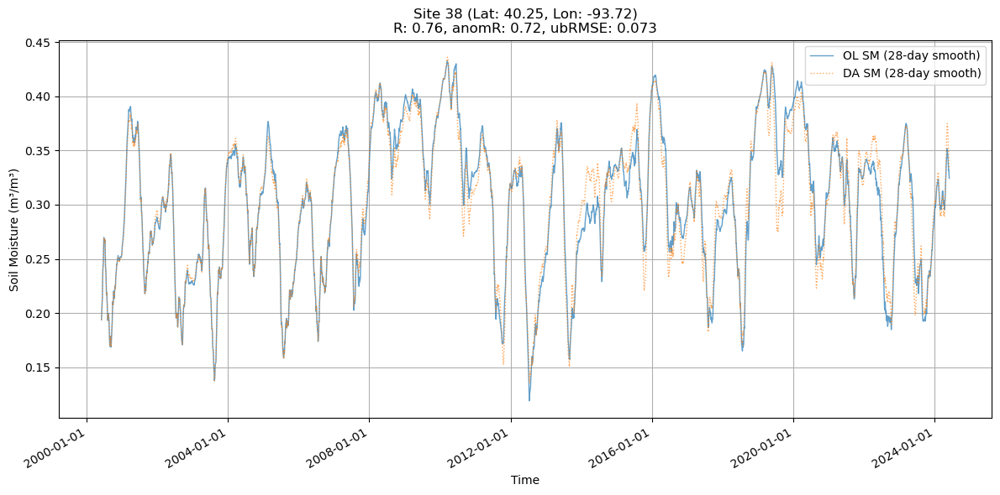

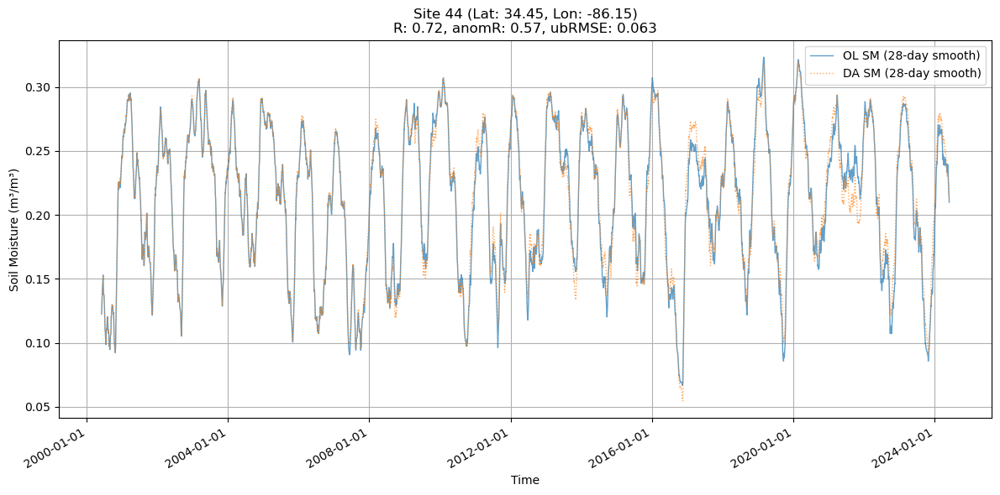

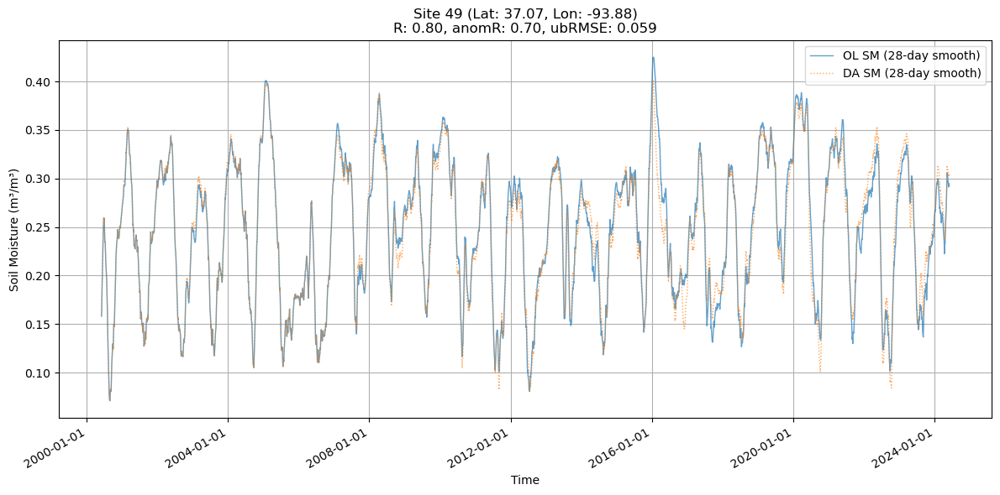

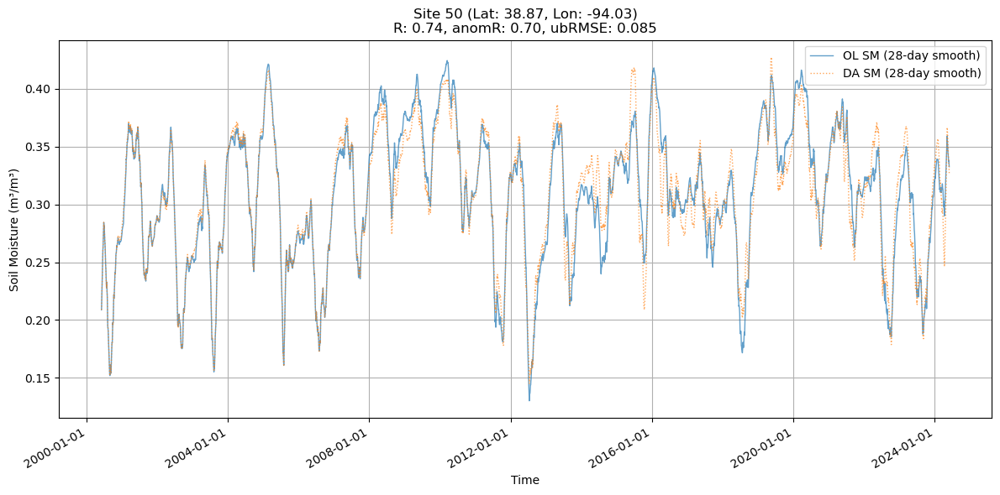

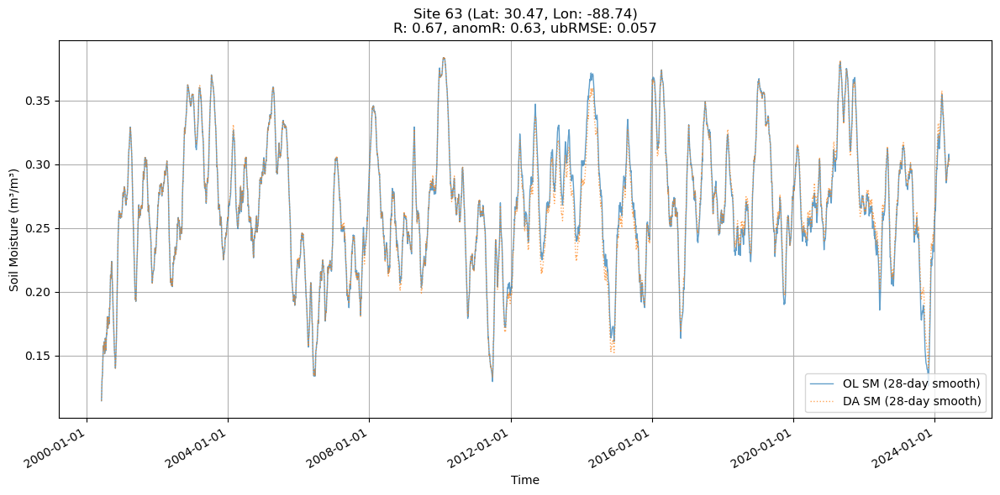

In [46]:
from scipy.ndimage import uniform_filter1d

# Loop through each site in top_balanced_indices_depth0
for site_idx in top_balanced_indices_depth0:
    # Extract observed and modeled soil moisture for the site
    observed_sm = INSITU_sm[:, 0, site_idx]  # Observed soil moisture (depth 0)
    modeled_sm_OL = LDAS_sm_OL[:, 0, site_idx]  # Modeled soil moisture (depth 0)
    modeled_sm_DA = LDAS_sm_DA[:, 0, site_idx]  # Modeled soil moisture (depth 0)

    # Apply a 28-day smoother (window size = 28) without interpolating NaN values
    # Replace NaN values with the mean of the non-NaN values for smoothing
    observed_sm_filled = np.nan_to_num(observed_sm, nan=np.nanmean(observed_sm))

    # Apply the uniform filter
    observed_sm_smooth = uniform_filter1d(observed_sm_filled, size=28, mode='nearest', origin=0)
    modeled_sm_OL_smooth = uniform_filter1d(modeled_sm_OL, size=28, mode='nearest', origin=0)
    modeled_sm_DA_smooth = uniform_filter1d(modeled_sm_DA, size=28, mode='nearest', origin=0)

    # Extract latitude and longitude
    lat = mat['INSITU_lat'][site_idx, 0]
    lon = mat['INSITU_lon'][site_idx, 0]

    # Extract R, anomR, and ubRMSE values for the site
    R_value = stats_OL['R'][site_idx, 0, 0, 0]  # R for the first range
    anomR_value = stats_OL['anomR'][site_idx, 0, 0, 0]  # anomR for the first range
    ubRMSE_value = stats_OL['ubRMSE'][site_idx, 0, 0, 0]  # ubRMSE for the first range

    # Create the plot
    plt.figure(figsize=(12, 6))
    # plt.plot(timestamps_arr, observed_sm_smooth, label='Obs SM (28-day smooth)', alpha=0.7, linewidth=1)
    plt.plot(timestamps_arr, modeled_sm_OL_smooth, label='OL SM (28-day smooth)', alpha=0.7, linewidth=1)
    plt.plot(timestamps_arr, modeled_sm_DA_smooth, ':', label='DA SM (28-day smooth)', alpha=0.7, linewidth=1)
    plt.xlabel('Time')
    plt.ylabel('Soil Moisture (m³/m³)')
    plt.title(f"Site {site_idx} (Lat: {lat:.2f}, Lon: {lon:.2f})\n"
              f"R: {R_value:.2f}, anomR: {anomR_value:.2f}, ubRMSE: {ubRMSE_value:.3f}")
    plt.legend()
    plt.grid(True)
    ax = plt.gca()
    ax.xaxis.set_major_locator(AutoDateLocator())
    ax.xaxis.set_major_formatter(DateFormatter('%Y-%m-%d'))
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    plt.show()

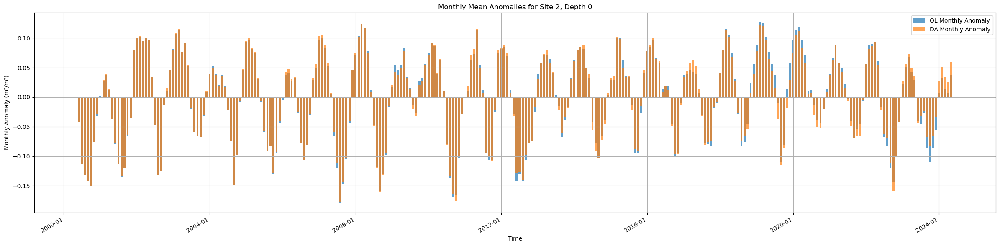

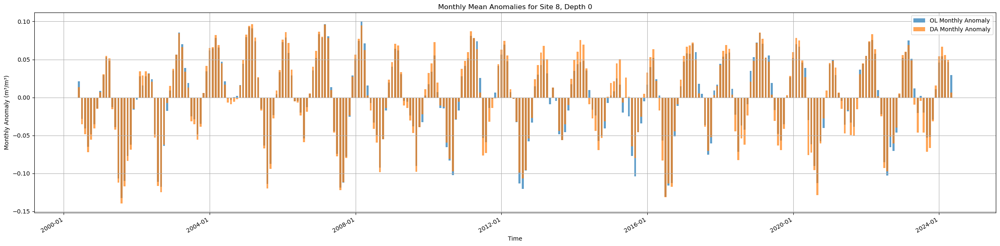

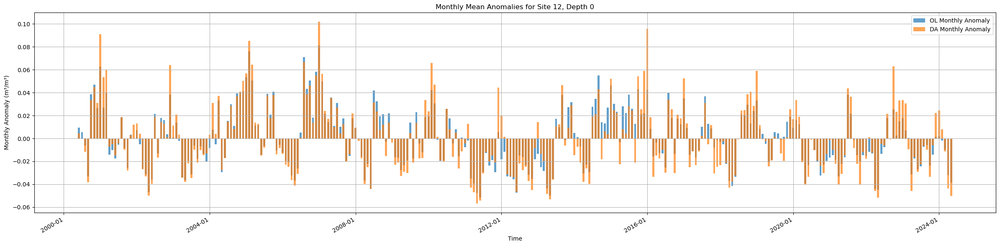

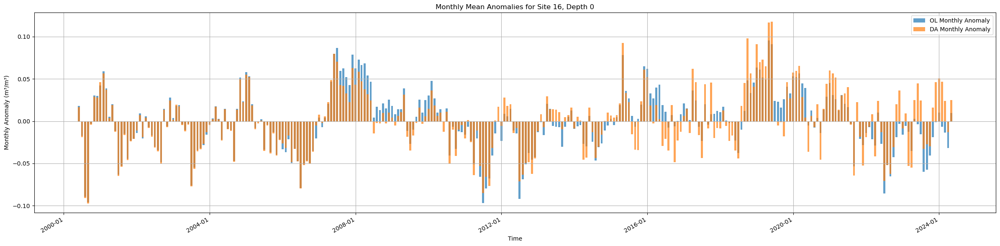

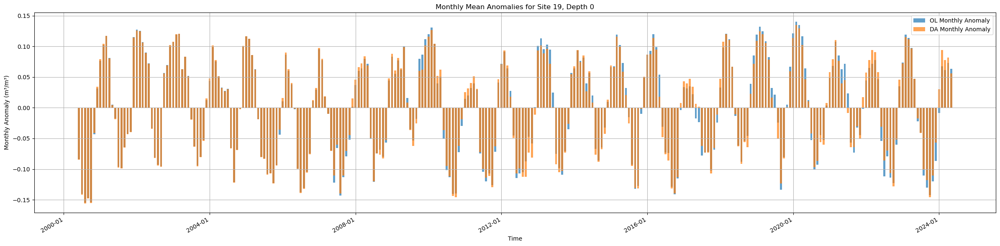

...

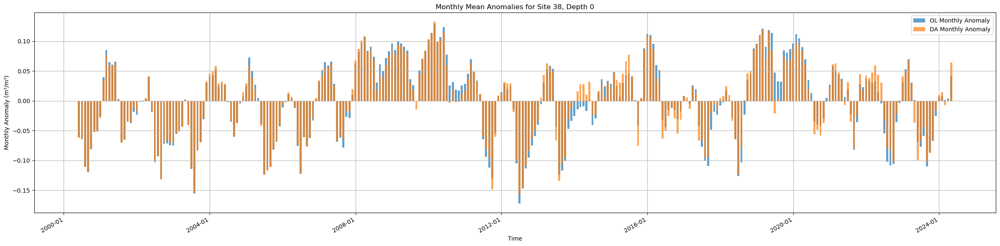

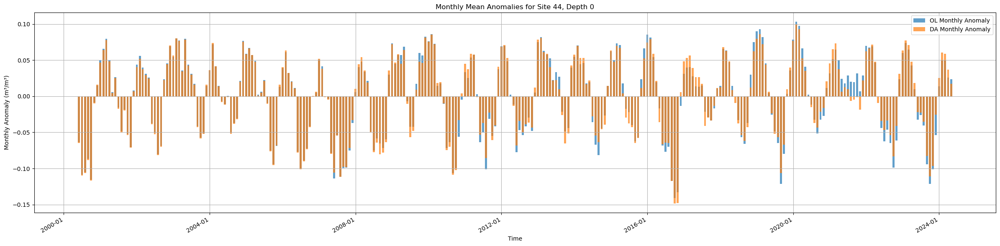

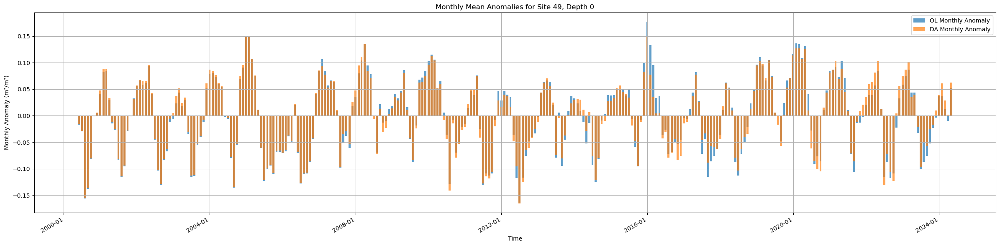

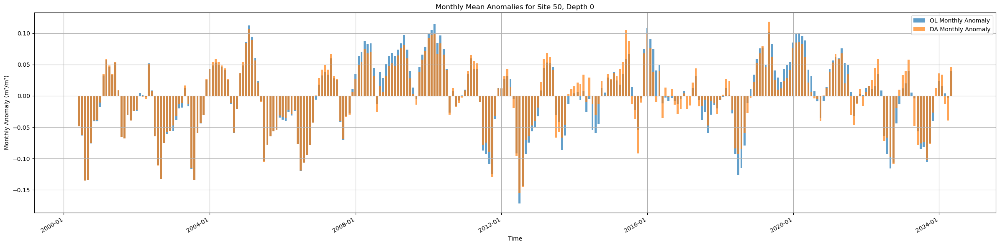

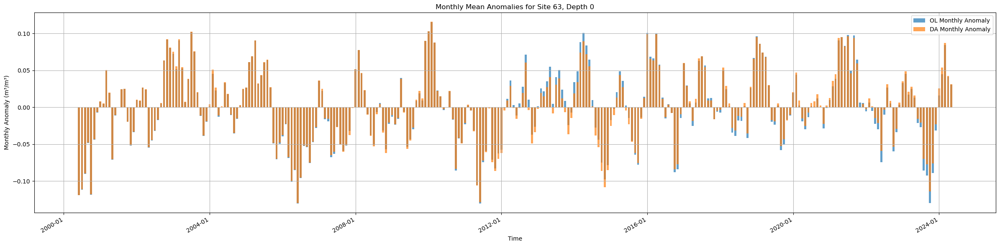

In [47]:
from pandas import DataFrame

# Ensure required variables are available
assert 'timestamps_arr' in globals(), "timestamps_arr not available"
assert 'LDAS_sm_OL' in globals(), "LDAS_sm_OL not loaded"
assert 'LDAS_sm_DA' in globals(), "LDAS_sm_DA not loaded"

# Convert timestamps to a DataFrame for easier grouping by month
timestamps_df = DataFrame({'timestamp': timestamps_arr})
timestamps_df['year_month'] = timestamps_df['timestamp'].dt.to_period('M')

# Prepare storage for monthly mean anomalies
monthly_anom_OL = []
monthly_anom_DA = []

# Loop through each site and depth
for depth in range(LDAS_sm_OL.shape[1]):
    for site in range(LDAS_sm_OL.shape[2]):
        # Extract time series for the current depth and site
        ts_OL = LDAS_sm_OL[:, depth, site]
        ts_DA = LDAS_sm_DA[:, depth, site]

        # Combine with timestamps for grouping
        df_OL = DataFrame({'value': ts_OL, 'year_month': timestamps_df['year_month']})
        df_DA = DataFrame({'value': ts_DA, 'year_month': timestamps_df['year_month']})

        # Calculate monthly means
        monthly_mean_OL = df_OL.groupby('year_month')['value'].mean()
        monthly_mean_DA = df_DA.groupby('year_month')['value'].mean()

        # Calculate anomalies (subtracting the overall mean for each site and depth)
        overall_mean_OL = monthly_mean_OL.mean()
        overall_mean_DA = monthly_mean_DA.mean()
        monthly_anom_OL.append(monthly_mean_OL - overall_mean_OL)
        monthly_anom_DA.append(monthly_mean_DA - overall_mean_DA)

# Convert lists of anomalies to DataFrames for easier plotting
monthly_anom_OL_df = DataFrame(monthly_anom_OL).T
monthly_anom_DA_df = DataFrame(monthly_anom_DA).T
monthly_anom_OL_df.index = monthly_mean_OL.index
monthly_anom_DA_df.index = monthly_mean_DA.index

# Ensure the DataFrames have proper column indices
monthly_anom_OL_df.columns = range(len(monthly_anom_OL))
monthly_anom_DA_df.columns = range(len(monthly_anom_DA))

# Example: Plot monthly mean anomalies for a specific site and depth
depth_idx = 0  # Change as needed

# Loop through each site in top_balanced_indices_depth0
for site_idx in top_balanced_indices_depth0:

    plt.figure(figsize=(24, 6))
    plt.bar(monthly_anom_OL_df.index.to_timestamp(), monthly_anom_OL_df[site_idx], label='OL Monthly Anomaly', alpha=0.7, width=20, align='center')
    plt.bar(monthly_anom_DA_df.index.to_timestamp(), monthly_anom_DA_df[site_idx], label='DA Monthly Anomaly', alpha=0.7, width=20, align='center')
    plt.xlabel('Time')
    plt.ylabel('Monthly Anomaly (m³/m³)')
    plt.title(f"Monthly Mean Anomalies for Site {site_idx}, Depth {depth_idx}")
    plt.legend()
    plt.grid(True)
    ax = plt.gca()
    ax.xaxis.set_major_locator(AutoDateLocator())
    ax.xaxis.set_major_formatter(DateFormatter('%Y-%m'))
    plt.xticks(rotation=30, ha='right')
    plt.tight_layout()
    plt.show()